In [1]:
import scanpy as sc
import anndata as ann
import numpy as np 
import seaborn as sb
import pandas as pd
import pickle
from sklearn import preprocessing as pp
import diffxpy.api as de
import time
from scipy import sparse

import sys  
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/mm_pancreas_atlas_rep/code/')
from importlib import reload  
import helper
reload(helper)
import helper as h
from constants import SAVE
import expected_multiplet_rate as emr
reload(emr)
import expected_multiplet_rate as emr
#sc.settings.verbosity = 3

from matplotlib import rcParams
import matplotlib.pyplot as plt

#R interface
import rpy2.rinterface_lib.callbacks
import logging
from rpy2.robjects import pandas2ri
import anndata2ri

rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

In [3]:
%%R
library(scran)
library(biomaRt)
library(BiocParallel)
library(Seurat)

In [4]:
# Path for saving results - last shared folder by all datasets
shared_folder='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/VSG_PF_WT_cohort/rev7/ref/'
UID2='VSG_annotation'

Load data:

In [7]:
#Load data
#adata=pickle.load(  open( shared_folder+"data_normalised.pkl", "rb" ) )
adata=h.open_h5ad(shared_folder+"data_normalised.h5ad",unique_id2=UID2)

## Visualisation

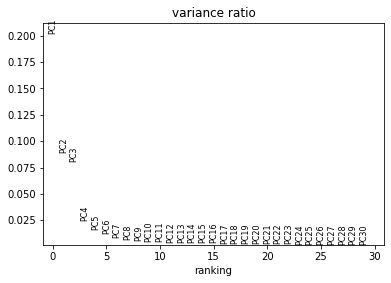

In [8]:
sc.pp.pca(adata, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata)

In [9]:
# Select number of PCs to use
N_PCS=9

Compare different embeddings based on previously defined annotation. 

In [13]:
#sc.pp.neighbors(adata,n_pcs = N_PCS,metric='correlation') 
#sc.tl.umap(adata)

In [14]:
#rcParams['figure.figsize']=(7,7)
#sc.pl.umap(adata,size=10,color=['pre_cell_type'])
#sc.pl.umap(adata,size=10,color=['file'])

In [10]:
sc.pp.neighbors(adata,n_pcs = N_PCS) 
sc.tl.umap(adata)

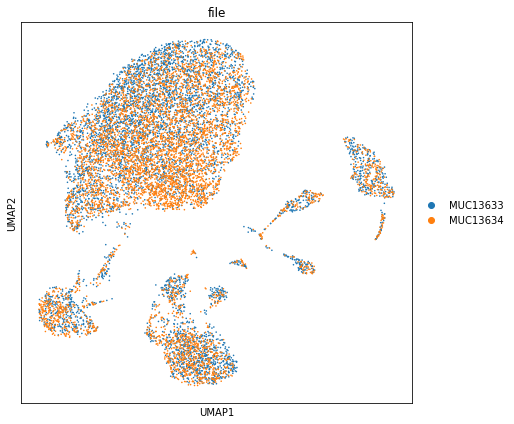

In [11]:
rcParams['figure.figsize']=(7,7)
#sc.pl.umap(adata,size=10,color=['pre_cell_type'])
sc.pl.umap(adata,size=10,color=['file'])

## Cell cycle
Performed separately for individual batches.

### Seurat/Scanpy - score by G2M and S

In [12]:
# Load mouse cell cycle genes
cell_cycle_mm=pd.read_table('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/cell_cycle_mm_Macosko2015.tsv',sep='\t')

Use cell cycle genes that overlap HVGs (from different batches). Display these genes on HVG plots (with non-phase genes being marked as .NA).

Use G2/M and M gene sets for G2/M annotation and S gene set for S annotation.

G1/S N genes: 92 overlap var: 90 overlap hvg (all): 6
S N genes: 96 overlap var: 90 overlap hvg (all): 8
G2/M N genes: 127 overlap var: 121 overlap hvg (all): 15
M N genes: 143 overlap var: 135 overlap hvg (all): 18
M/G1 N genes: 108 overlap var: 105 overlap hvg (all): 8
N genes for scoring S: 8 and G2/M: 33


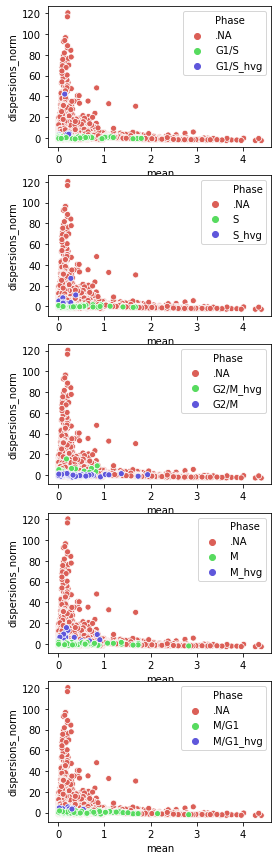

In [13]:
# How many of the cell cycle phase genes are present in HVG and in var and how variable they are
hvg=set(adata.var_names[adata.var.highly_variable])
i=0
rcParams['figure.figsize']=(4,15)
fig,axs=plt.subplots(5)
s_hvg=[]
g2m_hvg=[]
for phase in cell_cycle_mm.Phase.unique():
    genes_phase = set(cell_cycle_mm.query('Phase =="'+phase+'"').Gene)
    overlap_var = set(adata.var_names) & genes_phase
    overlap_hvg = hvg & genes_phase
    print(phase,'N genes:',len(genes_phase),'overlap var:',len(overlap_var),'overlap hvg (all):',len(overlap_hvg))
    phase_df=pd.DataFrame([phase]*len(overlap_var),index=overlap_var,columns=['Phase']).reindex(adata.var_names).fillna('.NA').sort_values('Phase')
    phase_df.loc[overlap_hvg,'Phase']=phase+'_hvg'
    phase_df['mean']=adata.var.means
    phase_df['dispersions_norm']=adata.var.dispersions_norm
    sb.scatterplot(x="mean", y="dispersions_norm", hue="Phase",data=phase_df,ax=axs[i],palette='hls')
    i+=1
    if phase == 'S':
        s_hvg.extend(overlap_hvg)
    if phase in ['G2/M','M']:
        g2m_hvg.extend(overlap_hvg)
        
print('N genes for scoring S:',len(s_hvg),'and G2/M:',len(g2m_hvg))

Cell cycle annotation

In [14]:
# Annotated cell cycle per batch
adata.obs['S_score']= np.zeros(adata.shape[0])
adata.obs['G2M_score'] = np.zeros(adata.shape[0])
adata.obs['phase'] = np.zeros(adata.shape[0])

for batch in enumerate(adata.obs['file'].cat.categories):
    batch=batch[1]
    idx = adata.obs.query('file=="'+batch+'"').index
    adata_tmp = adata[idx,:].copy()
    sc.tl.score_genes_cell_cycle(adata_tmp, s_genes=s_hvg, g2m_genes=g2m_hvg,use_raw=False)
    adata.obs.loc[idx,'S_score'] = adata_tmp.obs['S_score']
    adata.obs.loc[idx,'G2M_score'] = adata_tmp.obs['G2M_score']
    adata.obs.loc[idx,'phase'] = adata_tmp.obs['phase']
    
del adata_tmp

In [15]:
# Count of cells annotated to each phase
adata.obs['phase'].value_counts()

G2M    5658
S      2908
G1     2648
Name: phase, dtype: int64

Display cell cycle score distributions and annotation.

... storing 'phase' as categorical


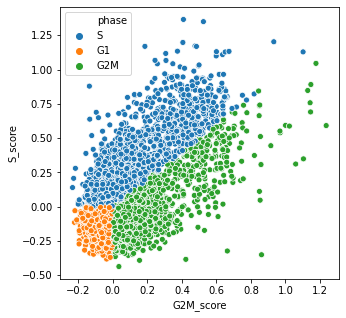

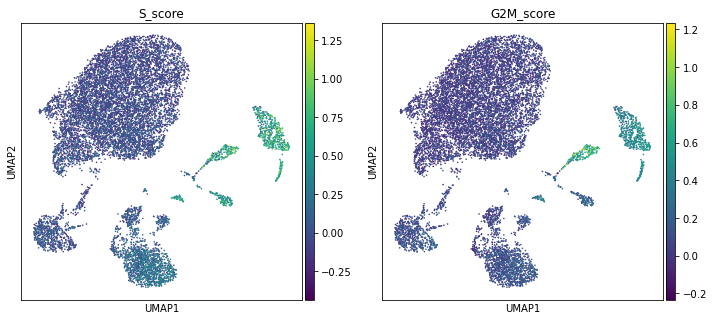

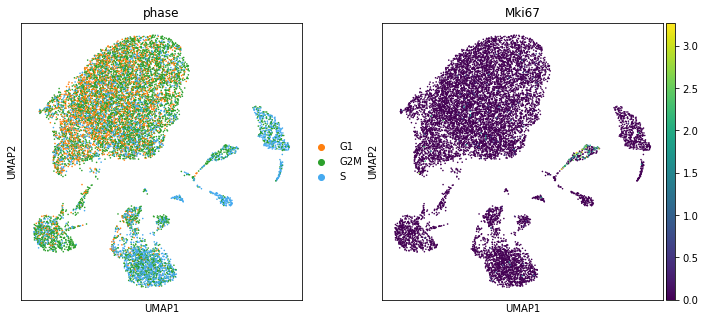

In [16]:
adata.uns['phase_colors']=['#ff7f0e', '#2ca02c','#46aaf0']

rcParams['figure.figsize']=(5,5)
sb.scatterplot(x='G2M_score',y='S_score',hue='phase',data=adata.obs)
sc.pl.umap(adata, color=['S_score', 'G2M_score'], size=10, use_raw=False)
sc.pl.umap(adata, color=['phase','Mki67'], size=10, use_raw=False)

#C: There might be some proliferating populations, but it is not very clear as many cells that probably are not proliferating (low Mki67 expression) are annotated as cycling.

 ### Cyclone - based on G1, S, and G2/M scores

Add gene Entrez IDs to adata in order to map genes to cell cycle database.

In [17]:
# Adata genes for R
genes=adata.var_names

In [18]:
%%R -i genes -o gene_ids
# Extract Ensembl gene IDs
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
gene_ids = getBM(attributes = c("mgi_symbol",'ensembl_gene_id'), filters = "mgi_symbol", values = genes , mart = mouse, uniqueRows=FALSE)

In [19]:
# Add gene ids to adata, use only genes with unique mapped ensembl ids
gene_ids.drop_duplicates(subset='mgi_symbol', keep=False, inplace=True)
gene_ids.index=gene_ids.mgi_symbol
gene_ids=gene_ids.reindex(list(adata.var_names))
adata.var['EID']=gene_ids.ensembl_gene_id

In [20]:
# Prepare R data for cyclonee
x_mat=adata.X.T
gene_ids=adata.var.EID
batches=adata.obs.file
cells=adata.obs.index

In [21]:
%%R -i x_mat -i gene_ids -i batches -i cells -o cyclone_anno
# Cyclone cell scores, calculated separately for each batch
mm.pairs <- readRDS(system.file("exdata", "mouse_cycle_markers.rds", package="scran"))
phases<-c()
s<-c()
g2m<-c()
g1<-c()
cells_order<-c()
for(batch in unique(batches)){
    # Select batch data
    x_mat_batch=x_mat[,batches==batch]
    print(batch,dim(x_mat_batch[1]))
    # Scores
    assignments <- cyclone(x_mat_batch, mm.pairs, gene.names=gene_ids,BPPARAM=MulticoreParam(workers = 16))
    phases<-c(phases,assignments$phases)
    s<-c(s,assignments$score$S)
    g2m<-c(g2m,assignments$score$G2M)
    g1<-c(g1,assignments$score$G1)
    # Save cell order
    cells_order<-c(cells_order,cells[batches==batch])
}
cyclone_anno<-data.frame(phase_cyclone=phases,s_cyclone=s,g2m_cyclone=g2m,g1_cyclone=g1)
rownames(cyclone_anno)<-cells_order

[1] "MUC13633"
[1] "MUC13634"


In [22]:
# Count of cells annotated to each phase
cyclone_anno.phase_cyclone.value_counts()

G1     11189
G2M       16
S          9
Name: phase_cyclone, dtype: int64

In [23]:
# Add cyclone annotation to adata
cyclone_anno=cyclone_anno.reindex(adata.obs.index)
adata.obs=pd.concat([adata.obs,cyclone_anno],axis=1)

... storing 'phase_cyclone' as categorical
... storing 'EID' as categorical


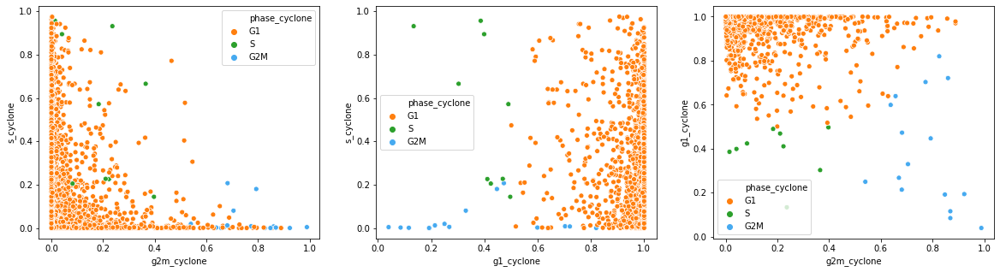

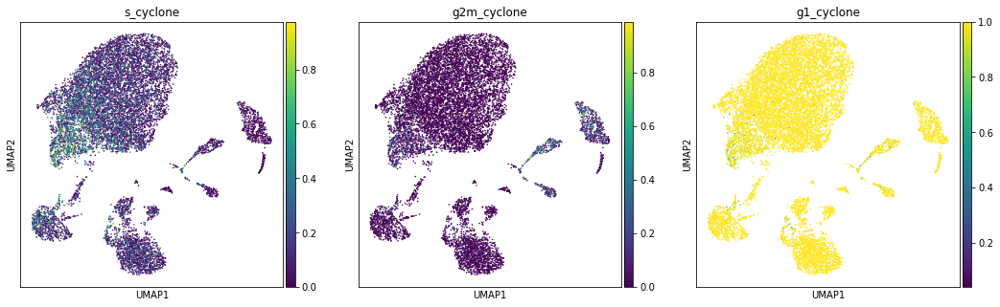

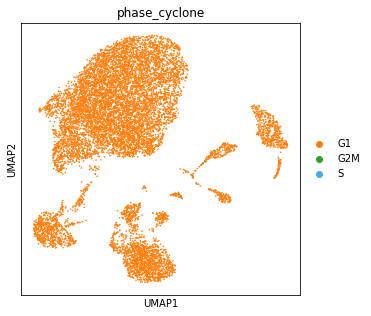

In [24]:
# Plot score distributions and cell assignment on UMAP
rcParams['figure.figsize']=(20,5)
fig,axs=plt.subplots(1,3)
palette=sb.color_palette(['#ff7f0e', '#2ca02c','#46aaf0'])
sb.scatterplot(x='g2m_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[0],palette=palette)
sb.scatterplot(x='g1_cyclone',y='s_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[1],palette=palette)
sb.scatterplot(x='g2m_cyclone',y='g1_cyclone',hue='phase_cyclone',data=cyclone_anno,ax=axs[2],palette=palette)
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['s_cyclone', 'g2m_cyclone','g1_cyclone'], size=10, use_raw=False)
adata.uns['phase_cyclone_colors']=['#ff7f0e', '#2ca02c','#46aaf0']
sc.pl.umap(adata, color=['phase_cyclone'], size=10, use_raw=False)

#C: The cyclone results seem more reliable based on Mki67 expression (above) and embedding.

## Save intermediate results before cell type annotation

In [26]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

# Cell type annotation

In [27]:
adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)

## Clustering

#### Leiden clustering on log transformed data.

In [28]:
sc.tl.leiden(adata,resolution=0.4)

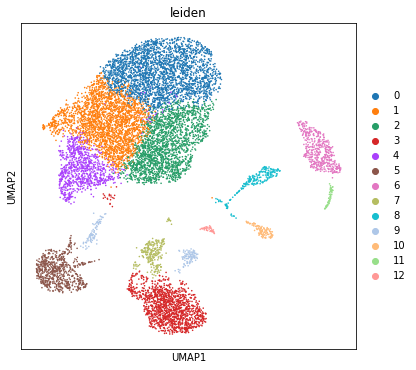

In [29]:
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata, color=['leiden'] ,size=10, use_raw=False)

#### Seurat style clustering

#### Leiden clustering on log transformed z-scaled data.

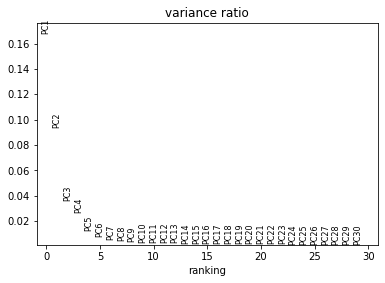

In [4]:
# Scale data and perform PCA
adata_scl=adata.copy()
sc.pp.scale(adata_scl,max_value=10)
sc.pp.pca(adata_scl, n_comps=30, use_highly_variable=True, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata_scl)

In [6]:
#C: Can stay the same as above
N_PCS

9

In [7]:
# neighbours on scaled data
sc.pp.neighbors(adata_scl,n_pcs = N_PCS) 

In [98]:
# This neighbour weight computation (used in  Seurat) does not improve clustering - the main improvement is due to scaling
#snn.shared_knn_adata(adata,n_pcs=N_PCS,n_jobs=8)

In [8]:
# Umap on scaled data
sc.tl.umap(adata_scl)

In [9]:
# Add scaled embedding to adata
adata.obsm['X_umap_scl']=adata_scl.obsm['X_umap']

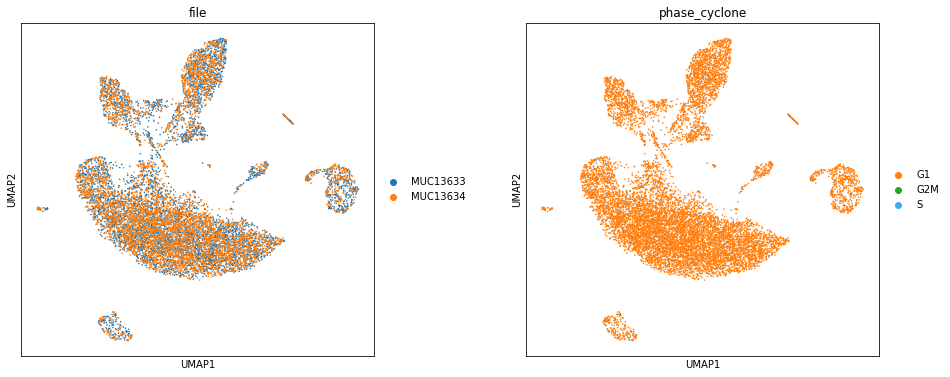

In [34]:
#del adata_scl.uns['sex_colors']
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata_scl, color=['file','phase_cyclone'] ,size=10, use_raw=False,wspace=0.3)

In [38]:
# Clustering resolution
res=0.5

In [39]:
# Cluster scaled data
sc.tl.leiden(adata_scl, resolution=res, key_added='leiden_scaled_r'+str(res), directed=True, use_weights=True)

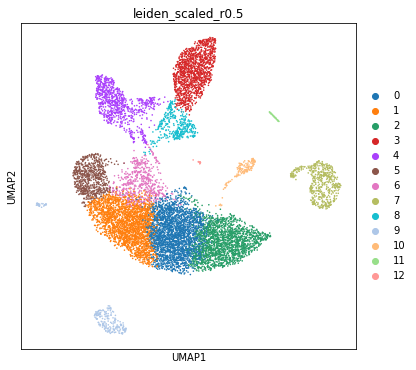

In [40]:
# Compare UMAPs and clusters on scaled data
rcParams['figure.figsize']=(6,6)
sc.pl.umap(adata_scl, color=['leiden_scaled_r'+str(res)] ,size=10, use_raw=False)

In [ ]:
#sc.pl.umap(adata_scl, color=['pre_cell_type'] ,size=10, use_raw=False)

#C: Umaps and clusterings on z-scaled data and non-z-scaled data perform similarly. z-scaled data will be used for consistency with other analysed studies.

## Cell type annotation

In [42]:
# Normalise raw data for plotting and cell type scoring
adata_raw=adata_scl.raw.to_adata().copy()
sc.pp.normalize_total(adata_raw, target_sum=1e4, exclude_highly_expressed=True,inplace=False)
sc.pp.log1p(adata_raw)
adata_rawnormalised=adata_scl.copy()
adata_rawnormalised.raw=adata_raw
del adata_raw

In [5]:
# Markers data
markers=pd.read_excel('/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/markers.xlsx',
                          sheet_name='mice')

In [44]:
# Subset markers to non-immature and non-dedifferentiated for initial annotation
print('Subtypes (original):',markers.Subtype.unique())
remove_subtype=['immature','dedifferentiated']
remove_subtype=[]
markers_filter=markers.query('Subtype not in @remove_subtype')

Subtypes (original): ['mature' 'immature' nan 'dedifferentiated' 'activated' 'quiescent'
 'cytotoxic']


acinar
Missing genes: ['Ptf1a', 'Ce1', 'Rbpj1']


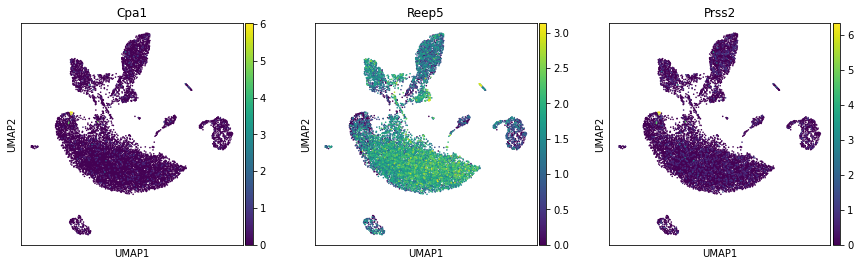

alpha
Missing genes: []


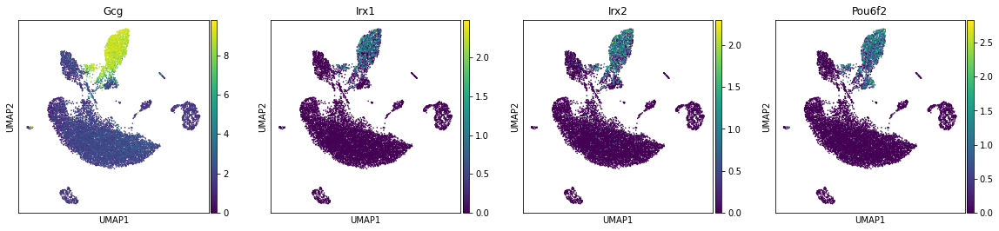

B immune
Missing genes: []


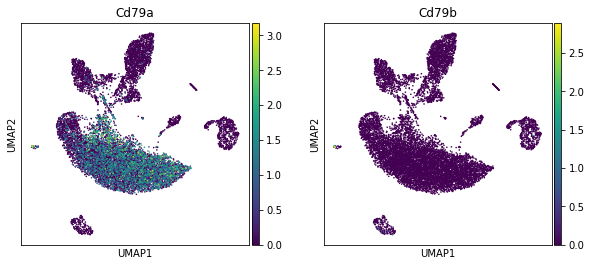

beta
Missing genes: ['Glut2', 'MafA', 'Pax4']


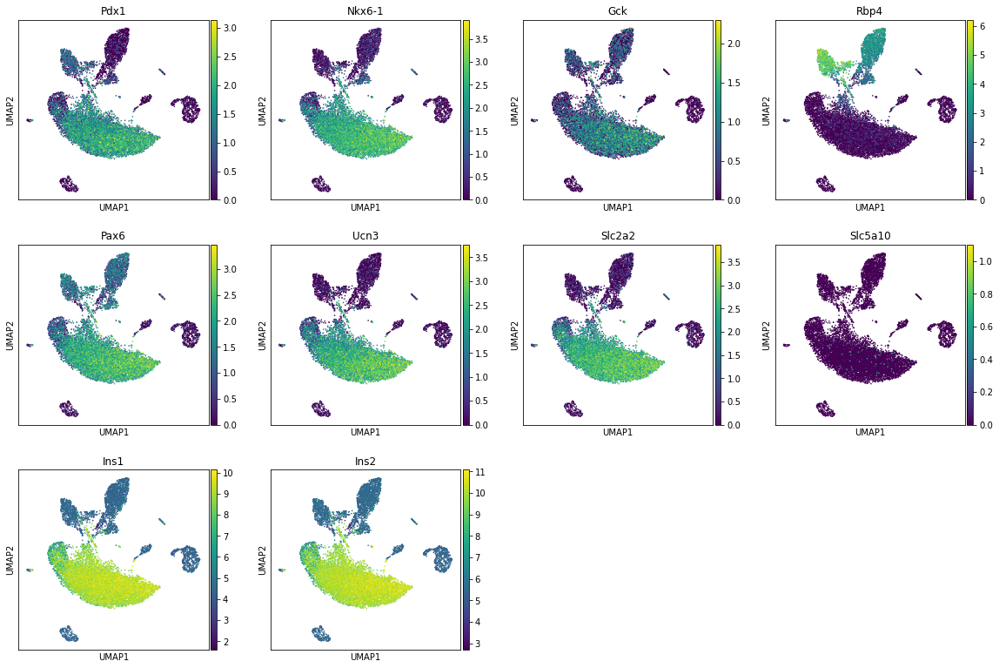

delta
Missing genes: []


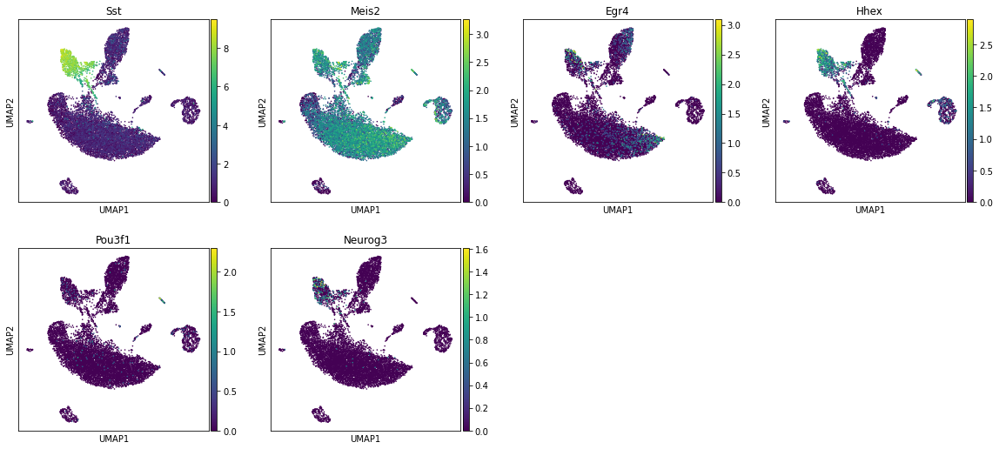

dendritic
Missing genes: ['Iftim3']


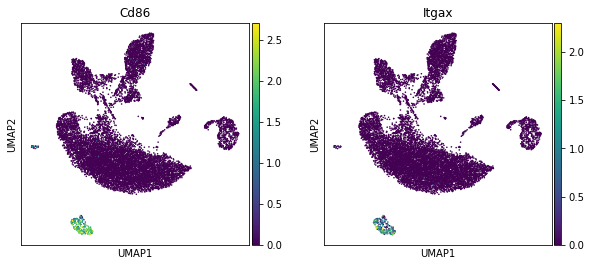

ductal
Missing genes: ['Ca2']


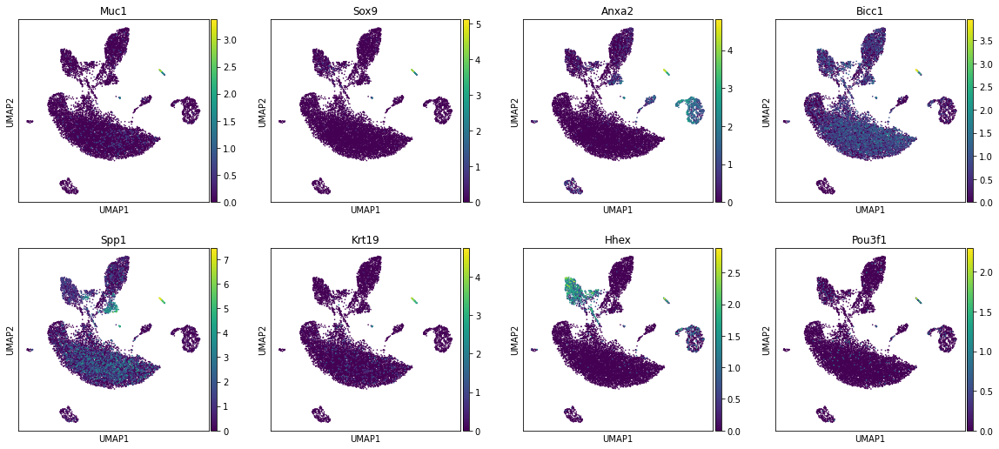

endocrine
Missing genes: ['Neurod2']


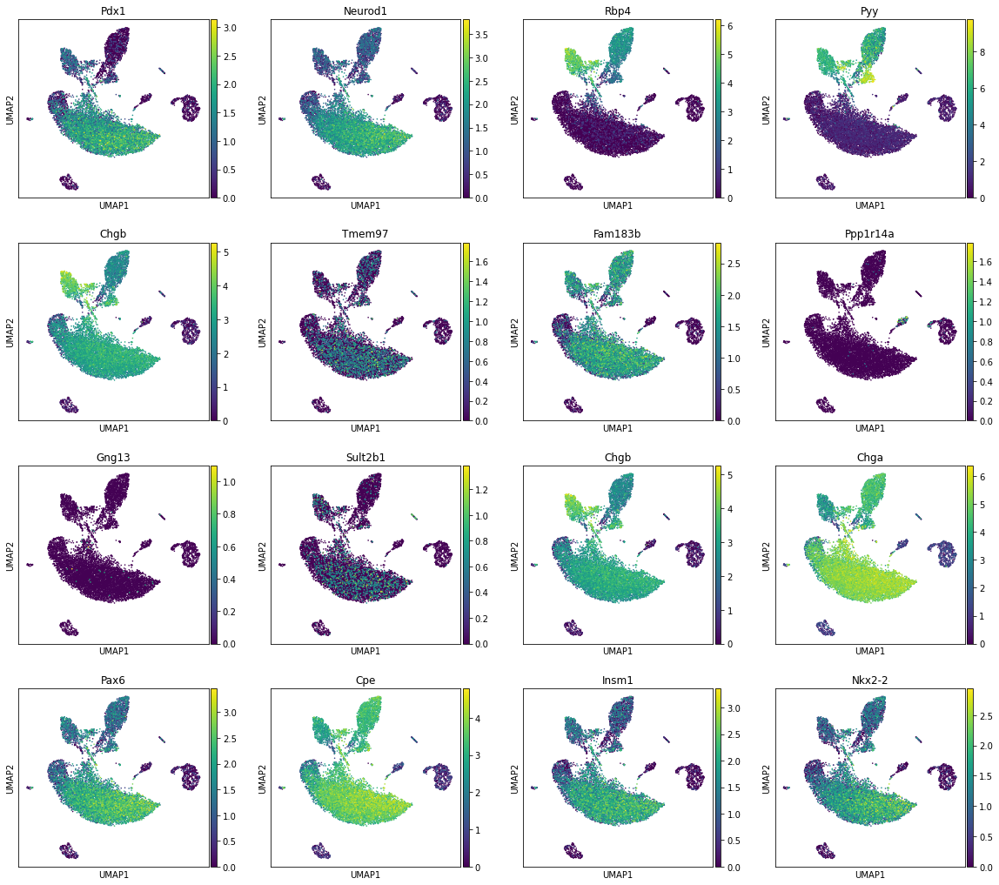

endothelial
Missing genes: []


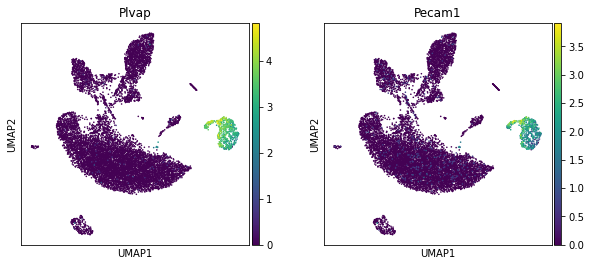

EP
Missing genes: ['Ngn3']


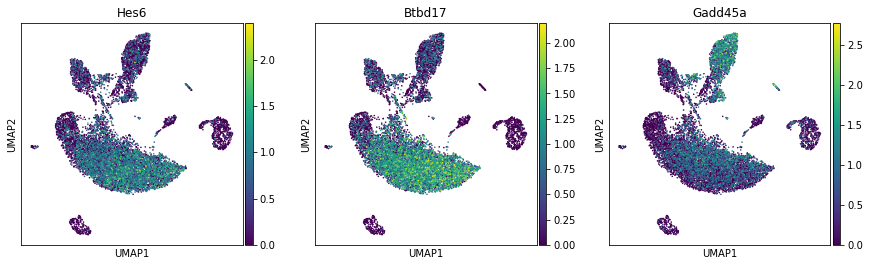

epithelial
Missing genes: []


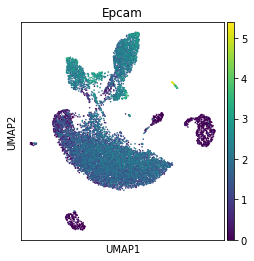

epsilon
No availiable genes (out of: ['Ghrl'] )

gamma
Missing genes: []


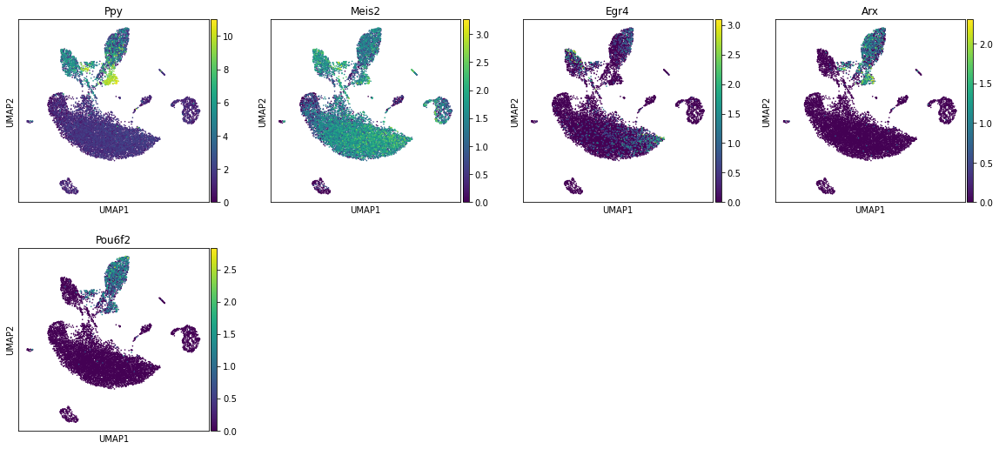

immune
Missing genes: []


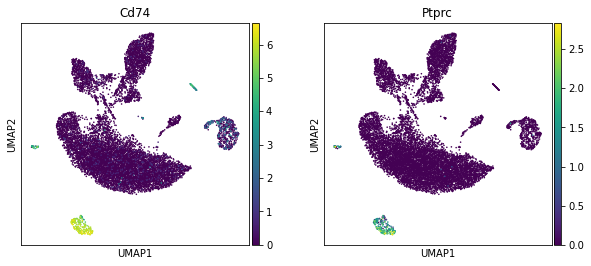

lymphocye
Missing genes: []


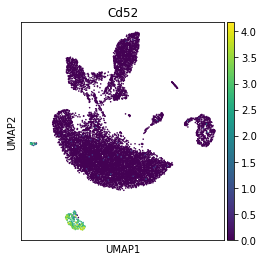

macrophage
Missing genes: []


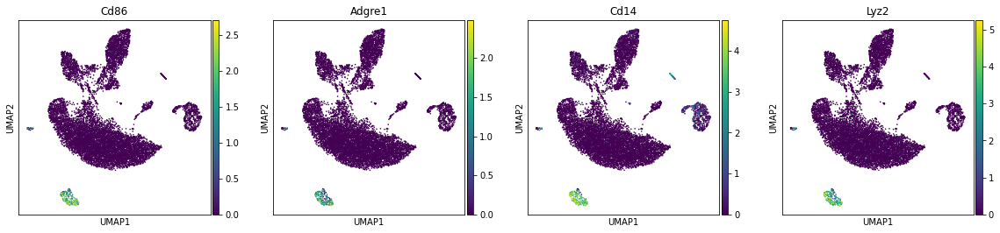

MPC
Missing genes: ['Bft3']


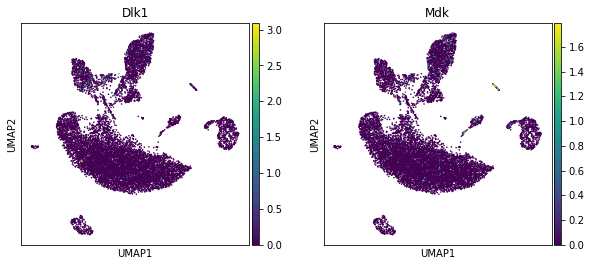

pericyte
Missing genes: []


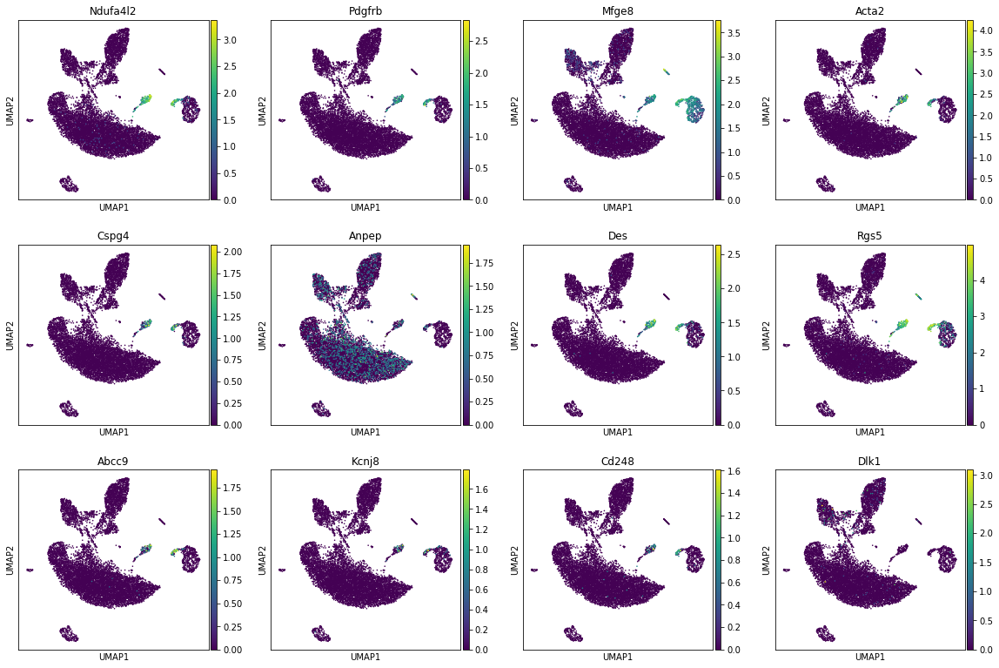

schwann
Missing genes: ['Sox10', 'Cmtm5', 'Ngfr']


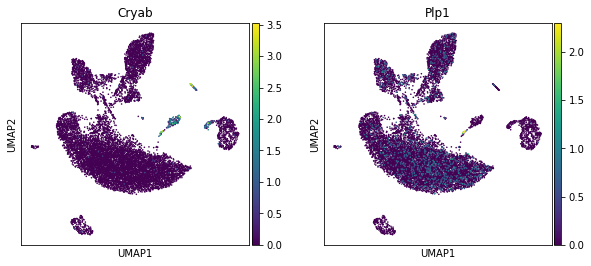

stellate
Missing genes: ['Pdgfra']


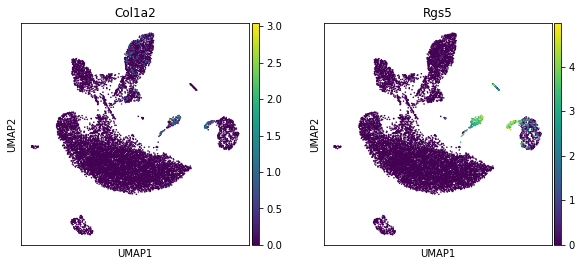

T immune
Missing genes: ['Cd8a', 'Cd3d']


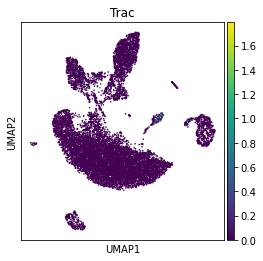

tip
Missing genes: []


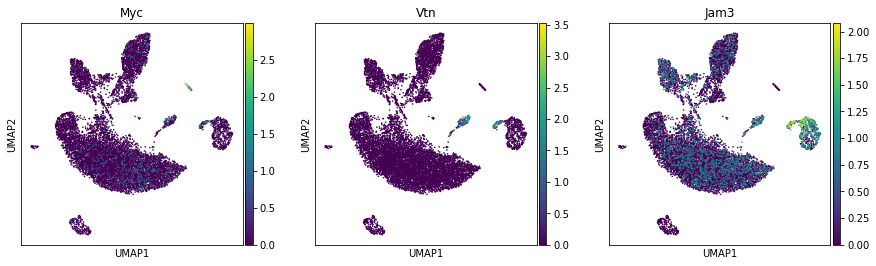

trunk
Missing genes: []


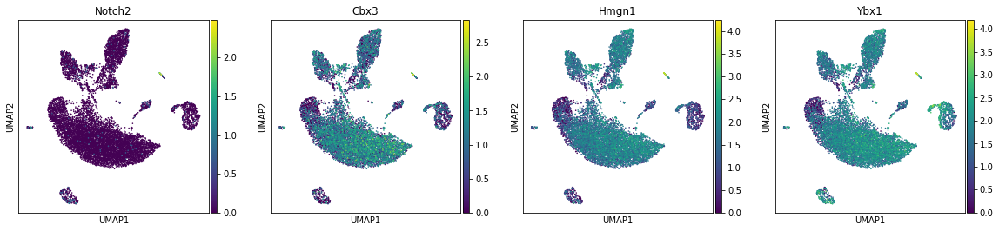

In [46]:
# Plot markers for each cell type
# Plot markers for each cell type
for cell_type in sorted(list(markers_filter.Cell.unique()), key=str.lower):
    print(cell_type)
    genes=list(markers_filter.query('Cell == "'+cell_type+'"').Gene)
    # Retain genes present in raw var_names
    missing=[gene for gene in genes if gene not in adata.raw.var_names]
    genes=[gene for gene in genes if gene in adata.raw.var_names]
    if len(genes)>0:
        print('Missing genes:',missing)
        rcParams['figure.figsize']=(4,4)
        #sc.pl.umap(adata_rawnormalised, color=['pre_cell_type'],size=10, use_raw=True)
        sc.pl.umap(adata_rawnormalised, color=genes ,size=10, use_raw=True)
    else:
        print('No availiable genes (out of:',missing,')\n')

In [52]:
# Selected markers that seem to be able to distinguish between cell types
# Use only hormone genes for endocrine cells
markers_selection={
'immune':['Cd86','Cd74','Ptprc','Cd52','Cd14','Lyz2'],
'schwann':['Plp1','Cryab'],
'endothelial':['Plvap','Pecam1'],
'pericyte':['Ndufa4l2','Pdgfrb','Acta2','Cspg4','Des','Rgs5','Abcc9'],
'ductal':['Muc1','Sox9','Anxa2','Bicc1','Krt19','Pou3f1'],
'alpha':['Gcg'],
'beta':['Ins1','Ins2'],
'delta':['Sst'],
'gamma':['Ppy']
}
#markers_selection={
#'immune':['Cd74','Ptprc','Cd86','Adgre1','Lyz2','Cd86','Itgax','Cd52'],
#'schwann':['Sox10'],
#'stellate':['Col1a2','Pdgfra'],
#'endothelial':['Plvap','Pecam1'],
#'ductal':['Muc1','Sox9','Spp1','Krt19'],
#'acinar':['Cpa1','Prss2'],
#'beta':['Slc2a2','Ins1','Ins2'],
#'alpha':['Gcg','Irx1','Irx2'],
#'delta':['Sst','Hhex','Neurog3'],
#'gamma':['Ppy'],
#'epsilon':['Ghrl']
#}

### Marker expression scores
Score each cell for marker expression of each cell type. Cells can thus be annotated qith 0 to N cell types. The presence of annotations is then checked for each cluster.

In [53]:
#Score cells for each cell type

# Save score column names 
scores=[]
for cell_type,genes in markers_selection.items():
    score_name=cell_type+'_score'
    scores.append(cell_type+'_score')
    sc.tl.score_genes(adata_rawnormalised, gene_list=genes, score_name=score_name,  use_raw=True)

In [55]:
# Which clusters (column name) to analyse for cell scores
res=0.5
clusters_col='leiden_scaled_r'+str(res)

In [56]:
# Add cluster information to the used adata
adata_rawnormalised.obs[clusters_col]=adata_scl.obs[clusters_col]

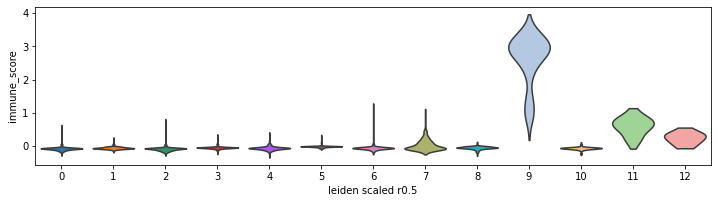

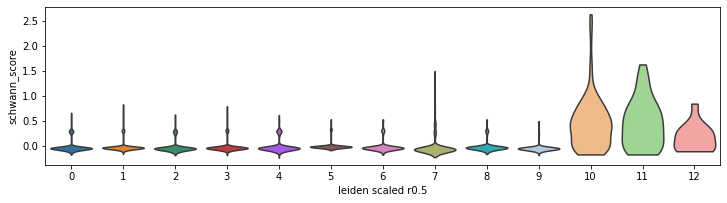

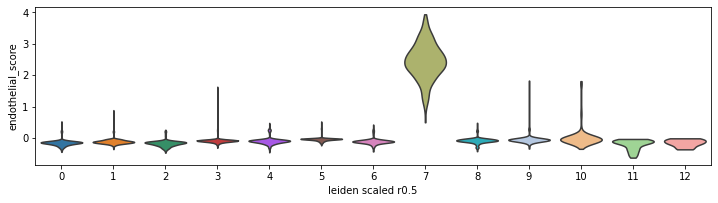

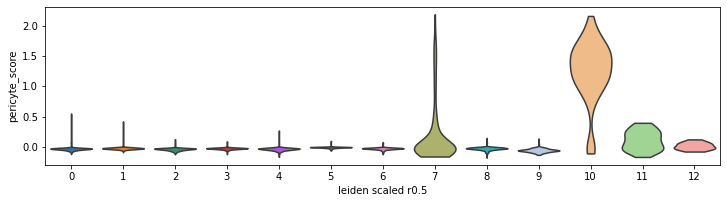

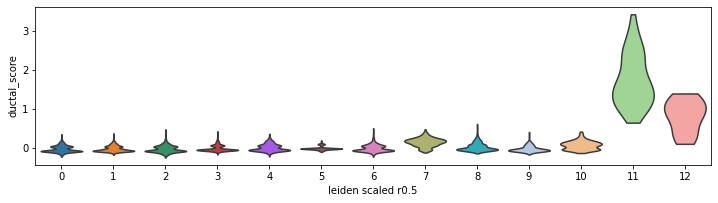

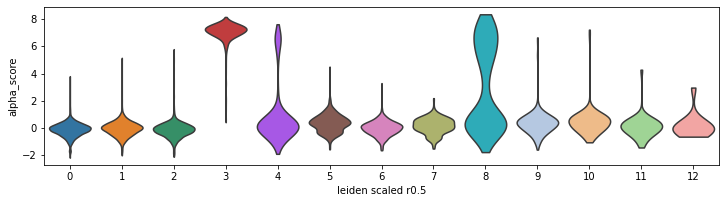

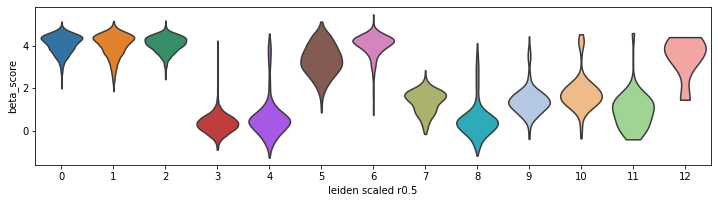

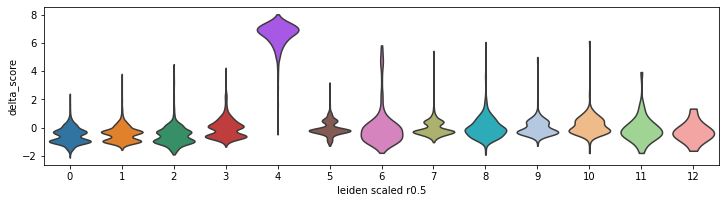

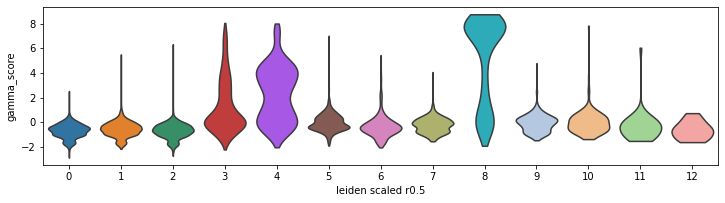

In [57]:
# Plot scores distribution across clusters
rcParams['figure.figsize']=(10,3)
for score in scores:
    sc.pl.violin(adata_rawnormalised, keys=score, groupby=clusters_col, use_raw=True, stripplot=False)

In [ ]:
# Scores per cluster, scaled from 0 to 1 in each cell type
#C: Not very informative!
#scores_df=adata_rawnormalised.obs[scores+[clusters_col]]
#score_means=scores_df.groupby(clusters_col).mean()
#score_means=pd.DataFrame(pp.minmax_scale(score_means),index=score_means.index,columns=score_means.columns)
#sb.clustermap(score_means,yticklabels=1)

In [58]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df_norm=adata_rawnormalised.obs[scores]
scores_df_norm=pd.DataFrame(pp.minmax_scale(scores_df_norm),columns=scores_df_norm.columns,index=adata_rawnormalised.obs.index)

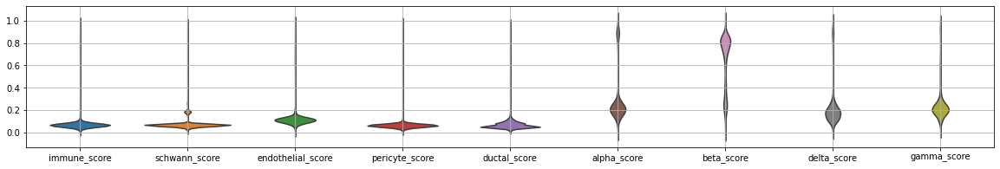

In [59]:
# Plot of normalised scores distribution in whole dataset, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm,inner=None,ax=ax)
ax.grid()

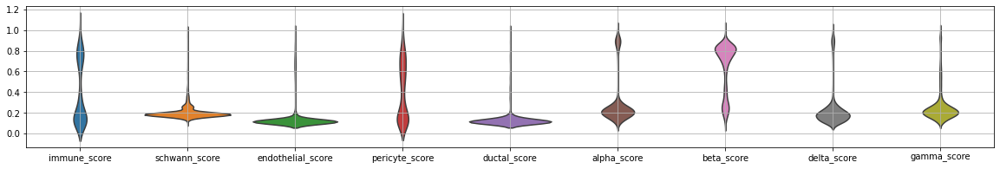

In [74]:
# Plot of normalised scores distribution, excluding low scores, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm[scores_df_norm>0.1],inner=None,ax=ax)
ax.grid()

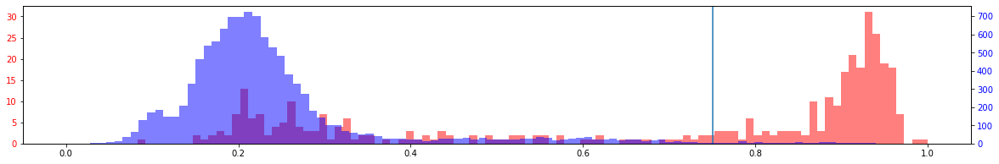

In [104]:
# Check gamma score in gamma cluster to reset the threshold
# Cluster 5 contains only partialy gamma cells
rcParams['figure.figsize']=(20,3)
fig,ax1=plt.subplots()
a=ax1.hist(scores_df_norm.gamma_score[(adata_scl.obs[clusters_col]=='8').values],bins=100,alpha=0.5,color='r')
ax1.tick_params(axis='y', labelcolor='r')
ax2 = ax1.twinx()
a=ax2.hist(scores_df_norm.gamma_score[(adata_scl.obs[clusters_col]!='8').values],bins=100,alpha=0.5,color='b')
ax2.tick_params(axis='y', labelcolor='b')
ax1.axvline(0.75)

In [75]:
# Thresholds for cell type assignemnt based on normalised scores
thresholds=[]
for col in scores_df_norm:
    threshold=0.5
    if col=='gamma_score':
        threshold=0.75
    elif col=='schwann_score':
        threshold=0.8
    elif col=='endothelial_score':
        threshold=0.4
    elif col=='pericyte_score':
        threshold=0.4
    elif col =='alpha_score' :
        threshold=0.6
    elif col =='delta_score' :
        threshold=0.6
    elif col =='ductal_score' :
        threshold=0.3
    thresholds.append(threshold)

In [76]:
# Assign cell types based on scores to each cell
assignment_df=scores_df_norm>=thresholds
assignment_df.columns=[col.replace('_score','') for col in scores_df_norm.columns] 

In [77]:
# Count of cells per cell type
assignment_df[[col.replace('_score','') for col in scores_df_norm.columns]].sum()

immune          183
schwann           4
endothelial     519
pericyte        183
ductal           48
alpha          1524
beta           7940
delta           840
gamma           339
dtype: int64

#C: Epsilon cells will be dissregarded as there are so few (2).

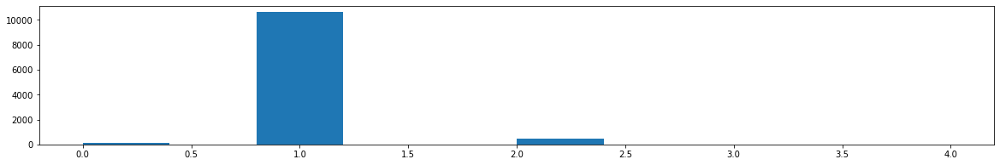

In [78]:
# How many cell types were annotated to each cell
a=plt.hist(assignment_df.sum(axis=1))

In [79]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions=[]
for idx,row in assignment_df.iterrows():
    type_union=''
    for col in row.index:
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions.append(type_union.rstrip('_'))

In [80]:
# Add cell types strings of cells to scores/assignment DF
assignment_df['type_union']=type_unions
assignment_df[clusters_col]=adata_rawnormalised.obs[clusters_col].values

### Annotate clusters

In [81]:
# Make DF of marker gene expressions (normalised, log transformed), scaled for each gene to [0,1]
used_markers=list(dict.fromkeys([marker for marker_list in markers_selection.values() for marker in marker_list]))
gene_idx=adata_rawnormalised.raw.var_names.isin(used_markers)
genes=adata_rawnormalised.raw.var_names[gene_idx]
scaled_expression=pd.DataFrame(pp.minmax_scale(adata_rawnormalised.raw.X.toarray()[:, gene_idx]),
                               columns=genes,index=adata_rawnormalised.obs.index
                              )[[marker for marker in used_markers if marker in genes]]

In [6]:
def add_category(df,idxs,col,category):
    """
    Add single value to multiple rows of DF column (useful when column might be categorical). 
    If column is categorical the value is beforehand added in the list of present categories 
    (required for categorical columns). 
    :param df: DF to which to add values
    :param idxs: Index names of rows where the value should be assigned to the column.
    :param col: Column to which to add the value.
    :param category: The value to add to rows,column.
    """
    # If column is already present, is categorical and value is not in categories add the value to categories first.
    if col in df.columns and df[col].dtype.name=='category' and category not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories([category])
    df.loc[idxs,col]=category

In [88]:
def subcluster(adata_cluster,res,original_cluster,assignment_df_temp,clusters_name_prefix='leiden_scaled_r'):
    """
    Cluster adata and add reult into cell type assignment DF. Plot the clustering on UMAP.
    Add name of the original cluster to which the adata belongs to new cluster names.
    Cluster column name: clusters_name_prefix+str(res) 
    :param adata_cluster: Adata (with already computed neighbours and UMAP) to cluster with leiden clustering. 
    :param res: Leiden resolution
    :param original_cluster: Original cluster name, new clusters are named 'original cluster'+'_'+'new cluster'
    :param assignment_df_temp: assignment_df to which to add clusters - should have same row order as adata
    :param clusters_name_prefix: Prefix for cluster column name.
    """
    clusters_col_name=clusters_name_prefix+str(res)
    sc.tl.leiden(adata_cluster, resolution=res, key_added=clusters_col_name, directed=True, use_weights=True)
    adata_cluster.obs[clusters_col_name]=[original_cluster+'_'+subcluster 
                                                 for subcluster in adata_cluster.obs[clusters_col_name]]
    sc.pl.umap(adata_cluster,color=clusters_col_name)
    time.sleep(1.0)
    
    assignment_df_temp['leiden_scaled_r'+str(res)]=adata_cluster.obs['leiden_scaled_r'+str(res)].values
    
def get_cluster_data(adata_original, cluster,cluster_col,assignment_df):
    """
    Subset adata and assignment_df to cluster.
    :param adata_original: Adata to subset.
    :param  cluster: Cluster for which to extract the data.
    :param cluster_col: Column where clusters are listed. Should be present in adata and assignment_df.
    :param assignment_df: DF with cell type assignmnets in column 'type_union' and cluster info. Should have index names
    that are present in adata.obs.index.
    :return: Subset of adata, assignment_df
    """
    adata_temp=adata_original[adata_original.obs[cluster_col]==cluster].copy()
    assignment_df_temp=pd.DataFrame(assignment_df.loc[adata_temp.obs.index,'type_union'])
    return adata_temp, assignment_df_temp

def cluster_annotate(assignment_df,cluster_col,present_threshold,nomain_threshold,
                     save,cluster_annotation,adata_main):
    """
    Loop through clusters, check present cell types and if there is no main cell type plot expression and QC metrics.
    For each cluster list proportion of present cell types.
    Expression (normalised, log transformed, [0,1] per gene scaled) is plotted for marker genes across cells (heatmap).
    QC metrics are plotted as scatterplot of N genes and N counts with cluster cells overlayed over all cels.
    :param assignment_df: DF with cell type assignment in column 'type_union' and cluster assignment.
    :param cluster_col: Cluster column name in assignment_df.
    :param present_threshold: Count among present cell types each cell type present if it represents 
    at least present_threshold proportion of cells in cluster. 
    :param nomain_threshold: If only 1 cell type was selected with present_threshold and 
    no cell type is present at proportion at least nomain_threshold add 'other' to annotated cell types list.
    :param save: Save cluster information to adata_main (column 'cluster') and cell types list to cluster_annotation.
    :param cluster_annotation: Dict where each cluster (key) has list of annotated cell types (value).
    :param adata_main: Add cluster to adata_main.obs.cluster. Use this adata for plotting of QC mettrics (for this a
    column 'temp_selected' is added.)
    """
    for group in assignment_df[['type_union',cluster_col]].groupby(cluster_col):
        types_summary=group[1].type_union.value_counts(normalize=True)
        present=list(types_summary[types_summary >= present_threshold].index)
        if len(present)==1 and types_summary.max() < nomain_threshold:
            present.append('other')
            
        if save:
            cluster_annotation[group[0]]=present
            add_category(df=adata_main.obs,idxs=group[1].index,col='cluster',category=group[0])
        
        print('\nCluster:',group[0],'\tsize:',group[1].shape[0])    
        print('Present:',present)
        print(types_summary)
        
        #present_nonna=[cell_type for cell_type in present if cell_type !='NA']
        #if len(present_nonna)!=1:
        if len(present)!=1 or present==['NA']:
            sb.clustermap(
                pd.DataFrame(scaled_expression.loc[group[1].index,:]),
                col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5), vmin=0,vmax=1)
            plt.title('Cluster: '+group[0]+' assigned:'+str(present))
            adata_main.obs['temp_selected']=adata_main.obs.index.isin(group[1].index)
            rcParams['figure.figsize']=(5,5)
            p1 = sc.pl.scatter(adata_main, 'n_counts', 'n_genes', color='temp_selected', size=40,color_map='viridis')
            time.sleep(1.0)

def save_cluster_annotation(adata,cluster_name,cell_types:list,cell_names):
    """
    Save cluster information for a set of cells to cluster_annotation (from outer scope) dictionary and specified adata.
    :param adata: Adata to which to save cluster name for cells. 
    Cluster information is saved to adata.obs in 'cluster' column.
    :param cluster_name: Name of the cluster.
    :param cell_types: List of cell types annotated to the cluster.
    :param cell_names: Cell names (matching adata.obs.index) to which the new cluster is asigned.
    """
    cluster_annotation[cluster_name]=cell_types
    add_category(df=adata.obs,idxs=cell_names,col='cluster',category=cluster_name)

In [106]:
#Save cell types annotated to each cluster
cluster_annotation=dict()


Cluster: 0 	size: 2457
Present: ['beta']
beta    0.999593
NA      0.000407
Name: type_union, dtype: float64

Cluster: 1 	size: 2261
Present: ['beta']
beta          0.996904
NA            0.001769
alpha_beta    0.001327
Name: type_union, dtype: float64

Cluster: 2 	size: 1825
Present: ['beta']
beta          0.996164
alpha_beta    0.002192
beta_delta    0.001096
beta_gamma    0.000548
Name: type_union, dtype: float64

Cluster: 3 	size: 1270
Present: ['alpha']
alpha                0.932283
alpha_gamma          0.048031
NA                   0.010236
gamma                0.004724
alpha_beta           0.003150
endothelial_alpha    0.000787
alpha_delta          0.000787
Name: type_union, dtype: float64

Cluster: 4 	size: 819
Present: ['delta', 'alpha_delta']
delta                     0.766789
alpha_delta               0.100122
beta_delta                0.058608
delta_gamma               0.035409
NA                        0.012210
alpha_delta_gamma         0.008547
alpha_beta_delta          0

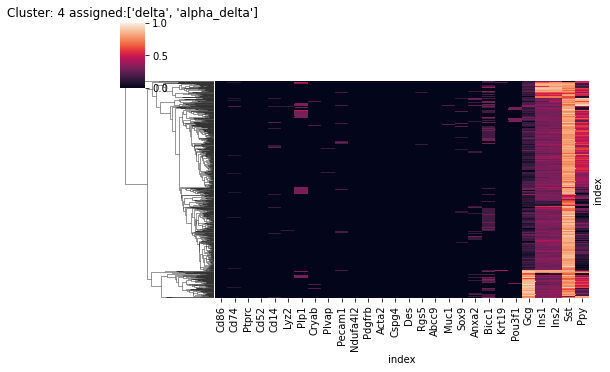

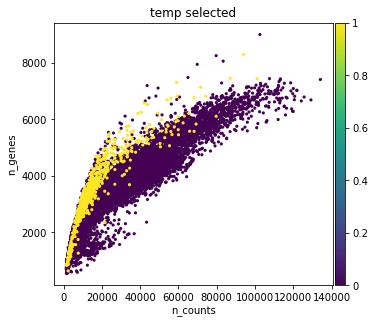


Cluster: 5 	size: 697
Present: ['beta']
beta          0.944046
NA            0.051650
alpha_beta    0.002869
beta_gamma    0.001435
Name: type_union, dtype: float64

Cluster: 6 	size: 577
Present: ['beta']
beta          0.937608
beta_delta    0.048527
NA            0.013865
Name: type_union, dtype: float64

Cluster: 7 	size: 524
Present: ['endothelial', 'endothelial_pericyte']
endothelial             0.816794
endothelial_pericyte    0.118321
endothelial_beta        0.041985
NA                      0.015267
beta                    0.003817
endothelial_delta       0.001908
pericyte                0.001908
Name: type_union, dtype: float64


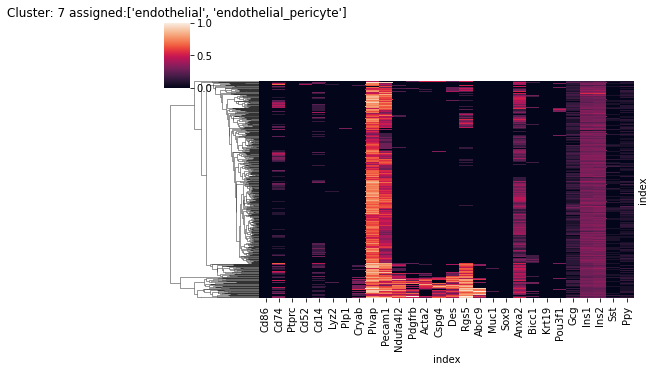

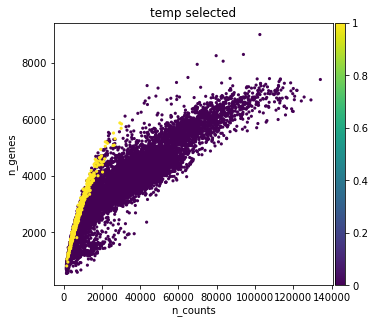


Cluster: 8 	size: 372
Present: ['gamma', 'alpha']
gamma               0.505376
alpha               0.276882
alpha_gamma         0.088710
NA                  0.051075
alpha_beta          0.048387
beta_gamma          0.013441
beta                0.010753
alpha_beta_gamma    0.002688
delta               0.002688
Name: type_union, dtype: float64


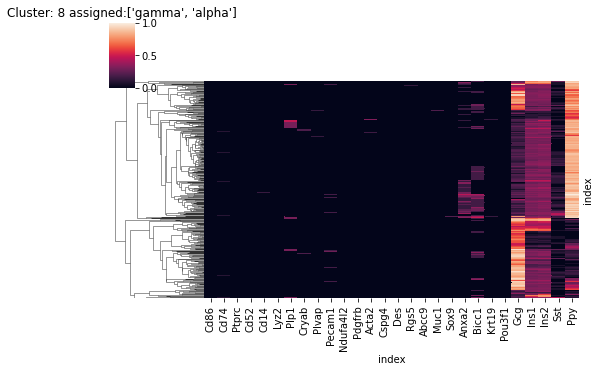

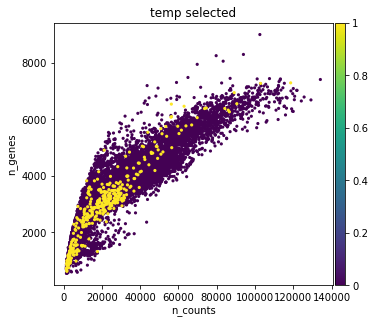


Cluster: 9 	size: 223
Present: ['immune', 'NA']
immune                0.784753
NA                    0.125561
beta                  0.040359
immune_beta           0.026906
alpha_beta_delta      0.008969
immune_alpha_beta     0.004484
immune_endothelial    0.004484
alpha                 0.004484
Name: type_union, dtype: float64


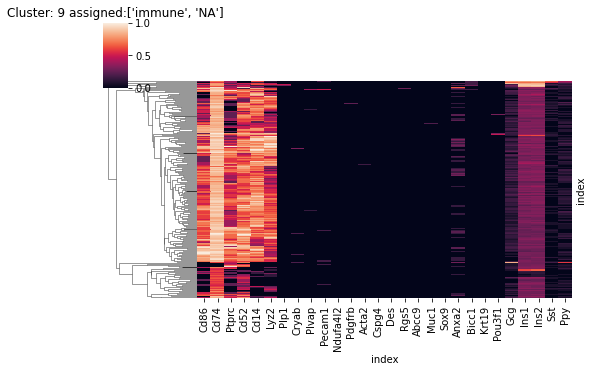

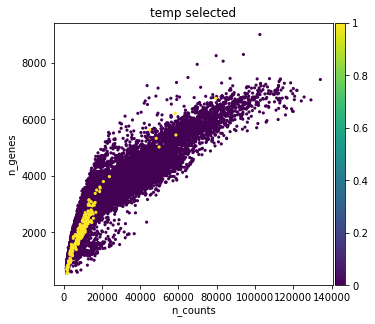


Cluster: 10 	size: 134
Present: ['pericyte', 'pericyte_beta']
pericyte            0.731343
pericyte_beta       0.134328
endothelial_beta    0.029851
beta                0.022388
NA                  0.022388
schwann             0.022388
pericyte_alpha      0.014925
schwann_beta        0.007463
pericyte_delta      0.007463
pericyte_gamma      0.007463
Name: type_union, dtype: float64


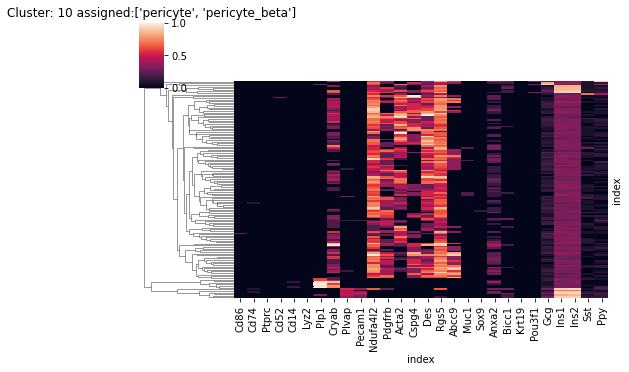

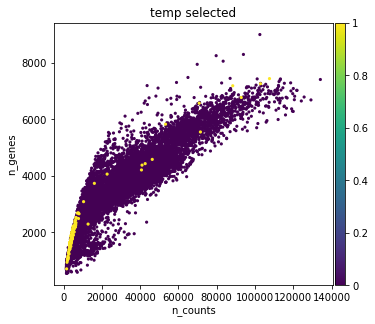


Cluster: 11 	size: 42
Present: ['ductal']
ductal          0.880952
ductal_beta     0.047619
ductal_alpha    0.023810
NA              0.023810
ductal_gamma    0.023810
Name: type_union, dtype: float64

Cluster: 12 	size: 13
Present: ['ductal_beta', 'beta', 'NA']
ductal_beta    0.538462
beta           0.307692
NA             0.153846
Name: type_union, dtype: float64


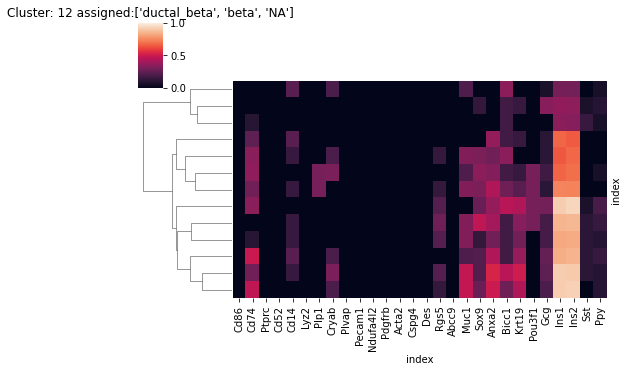

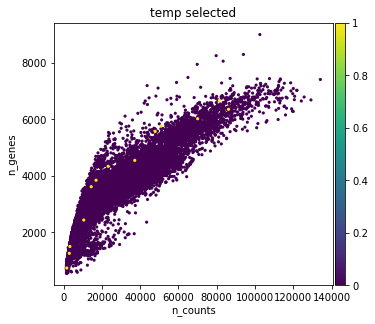

In [107]:
# Display cell type annotation distribution of each cluster.
cluster_annotate(assignment_df=assignment_df,
                 cluster_col=clusters_col,present_threshold=0.1,nomain_threshold=0.7,
                     save=True,cluster_annotation=cluster_annotation,adata_main=adata_rawnormalised)

In [108]:
# Correct annotation
cluster_annotation['9']=['immune']

... storing 'leiden_scaled_r0.4' as categorical


**** Original cluster 4


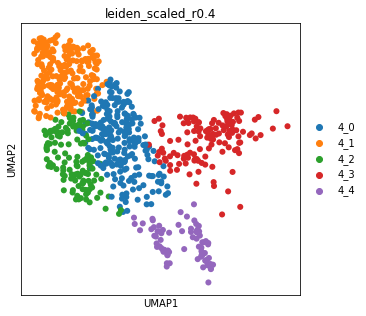


Cluster: 4_0 	size: 249
Present: ['delta']
delta          0.935743
beta_delta     0.044177
alpha_delta    0.012048
delta_gamma    0.008032
Name: type_union, dtype: float64

Cluster: 4_1 	size: 226
Present: ['delta']
delta    1.0
Name: type_union, dtype: float64

Cluster: 4_2 	size: 137
Present: ['delta']
delta    1.0
Name: type_union, dtype: float64

Cluster: 4_3 	size: 132
Present: ['alpha_delta', 'other']
alpha_delta               0.598485
delta_gamma               0.196970
delta                     0.060606
alpha_delta_gamma         0.053030
alpha_beta_delta          0.037879
alpha_beta_delta_gamma    0.022727
alpha                     0.015152
alpha_gamma               0.007576
gamma                     0.007576
Name: type_union, dtype: float64


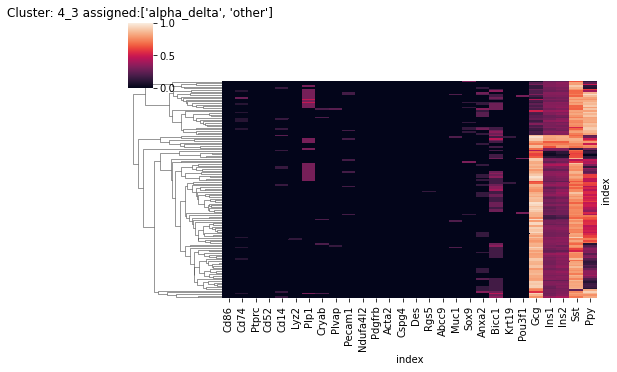

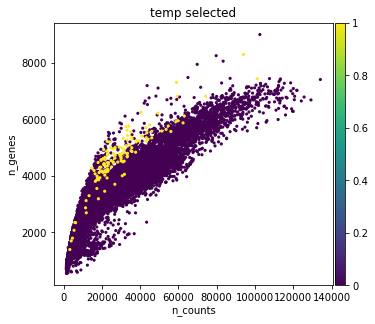


Cluster: 4_4 	size: 75
Present: ['beta_delta', 'delta']
beta_delta          0.493333
delta               0.320000
NA                  0.133333
alpha_beta_delta    0.026667
beta                0.013333
delta_gamma         0.013333
Name: type_union, dtype: float64


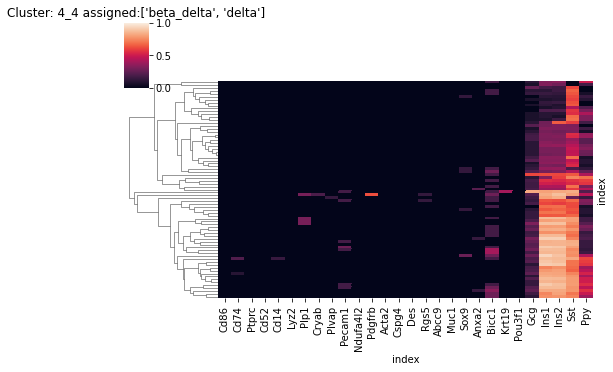

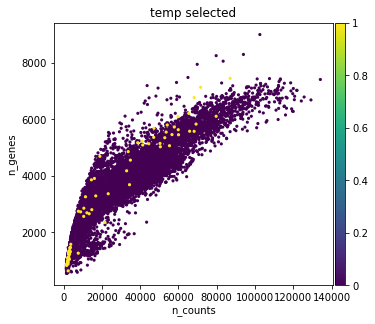

... storing 'leiden_scaled_r0.4' as categorical


**** Original cluster 7


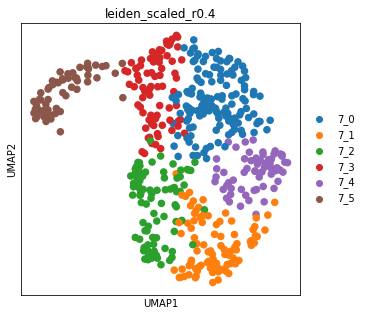

... storing 'leiden_scaled_r0.4' as categorical



Cluster: 7_0 	size: 140
Present: ['endothelial']
endothelial             0.942857
endothelial_beta        0.035714
endothelial_delta       0.007143
endothelial_pericyte    0.007143
NA                      0.007143
Name: type_union, dtype: float64

Cluster: 7_1 	size: 92
Present: ['endothelial']
endothelial         0.869565
NA                  0.065217
endothelial_beta    0.054348
beta                0.010870
Name: type_union, dtype: float64

Cluster: 7_2 	size: 87
Present: ['endothelial']
endothelial             0.977011
endothelial_beta        0.011494
endothelial_pericyte    0.011494
Name: type_union, dtype: float64

Cluster: 7_3 	size: 81
Present: ['endothelial']
endothelial             0.962963
endothelial_pericyte    0.024691
endothelial_beta        0.012346
Name: type_union, dtype: float64

Cluster: 7_4 	size: 64
Present: ['endothelial']
endothelial         0.812500
endothelial_beta    0.156250
NA                  0.015625
beta                0.015625
Name: type_union, dtype: fl

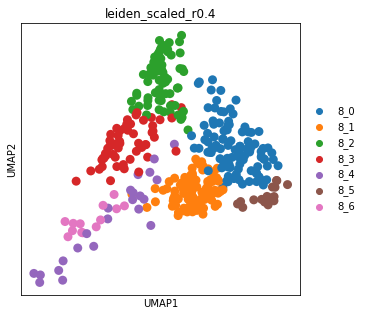


Cluster: 8_0 	size: 103
Present: ['gamma', 'alpha_gamma']
gamma          0.728155
alpha_gamma    0.203883
NA             0.038835
alpha          0.029126
Name: type_union, dtype: float64


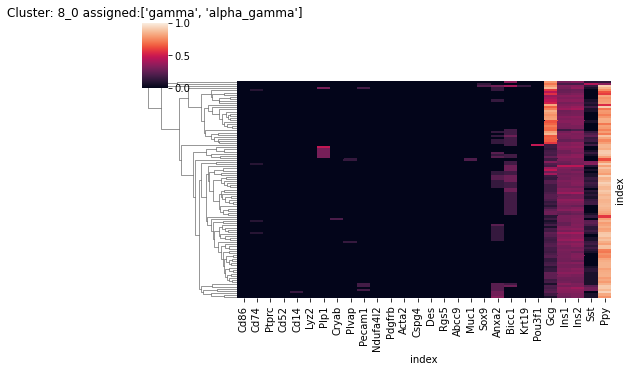

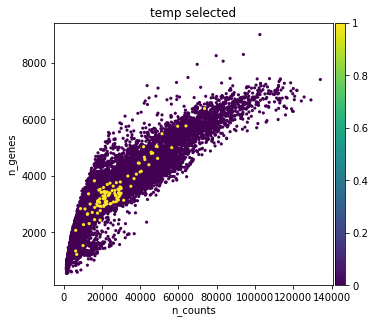


Cluster: 8_1 	size: 91
Present: ['gamma']
gamma               0.901099
beta_gamma          0.054945
NA                  0.032967
alpha_beta_gamma    0.010989
Name: type_union, dtype: float64

Cluster: 8_2 	size: 69
Present: ['alpha', 'other']
alpha          0.768116
alpha_gamma    0.173913
gamma          0.043478
NA             0.014493
Name: type_union, dtype: float64


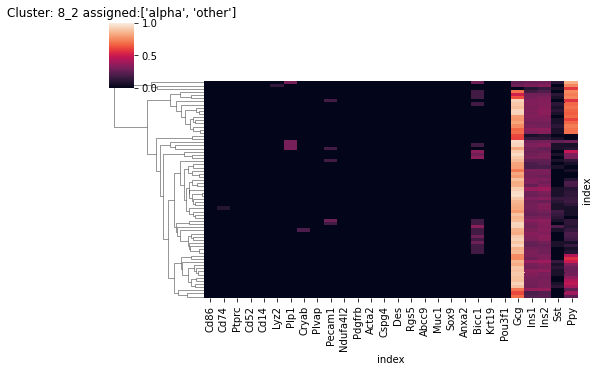

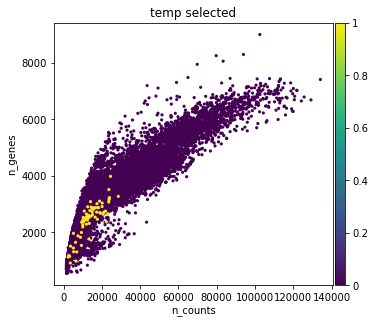


Cluster: 8_3 	size: 54
Present: ['alpha', 'other']
alpha    0.759259
NA       0.129630
gamma    0.092593
beta     0.018519
Name: type_union, dtype: float64


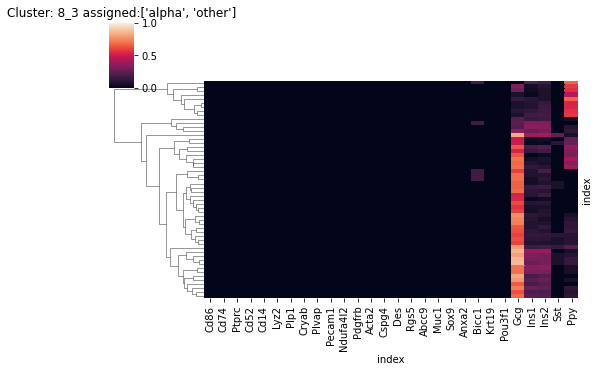

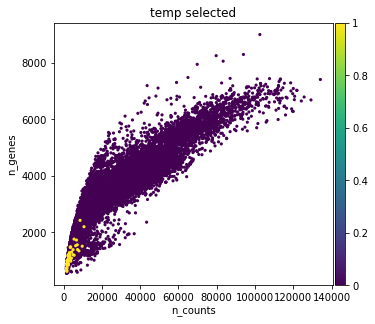


Cluster: 8_4 	size: 23
Present: ['alpha_beta', 'alpha']
alpha_beta    0.782609
alpha         0.217391
Name: type_union, dtype: float64


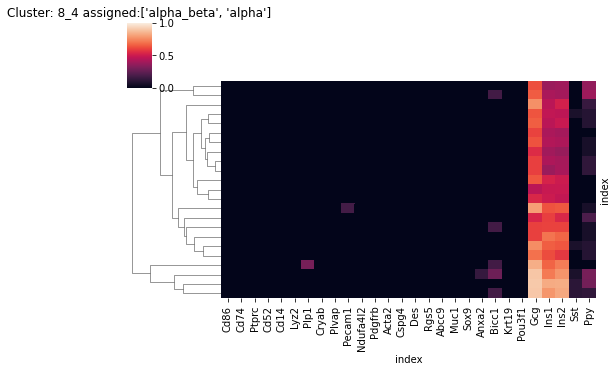

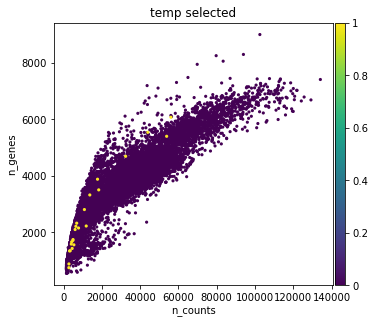


Cluster: 8_5 	size: 19
Present: ['gamma']
gamma    1.0
Name: type_union, dtype: float64

Cluster: 8_6 	size: 13
Present: ['gamma', 'NA', 'beta']
gamma    0.307692
NA       0.307692
beta     0.230769
delta    0.076923
alpha    0.076923
Name: type_union, dtype: float64


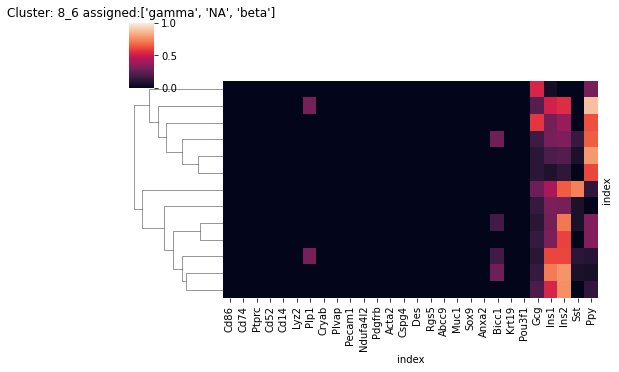

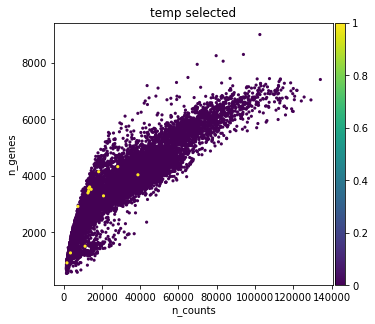

... storing 'leiden_scaled_r0.4' as categorical


**** Original cluster 10


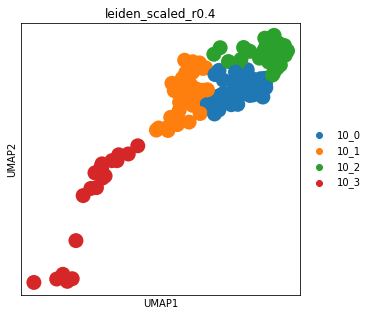


Cluster: 10_0 	size: 40
Present: ['pericyte']
pericyte         0.85
pericyte_beta    0.15
Name: type_union, dtype: float64

Cluster: 10_1 	size: 39
Present: ['pericyte', 'other']
pericyte          0.743590
pericyte_beta     0.179487
NA                0.025641
beta              0.025641
pericyte_delta    0.025641
Name: type_union, dtype: float64


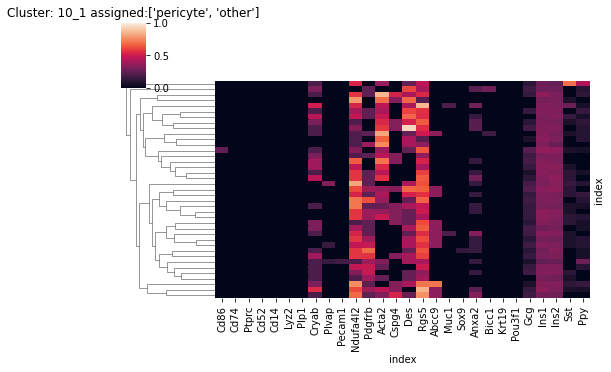

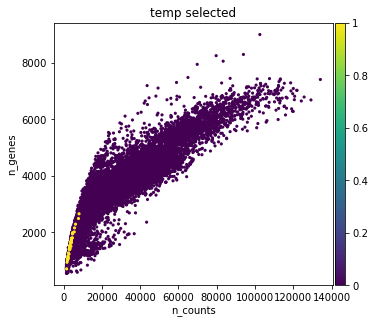


Cluster: 10_2 	size: 35
Present: ['pericyte']
pericyte    1.0
Name: type_union, dtype: float64

Cluster: 10_3 	size: 20
Present: ['pericyte_beta', 'endothelial_beta']
pericyte_beta       0.25
endothelial_beta    0.20
schwann             0.15
beta                0.10
pericyte_alpha      0.10
NA                  0.10
schwann_beta        0.05
pericyte_gamma      0.05
Name: type_union, dtype: float64


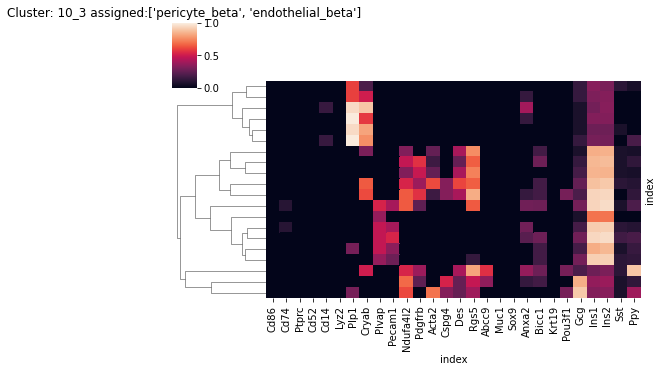

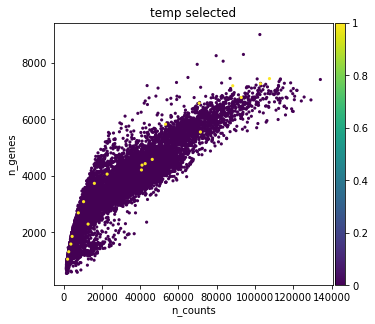

... storing 'leiden_scaled_r0.4' as categorical


**** Original cluster 12


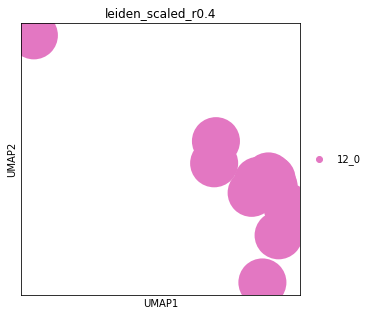


Cluster: 12_0 	size: 13
Present: ['ductal_beta', 'beta']
ductal_beta    0.538462
beta           0.307692
NA             0.153846
Name: type_union, dtype: float64


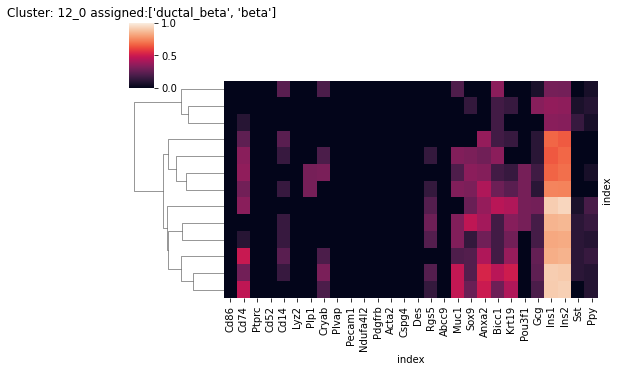

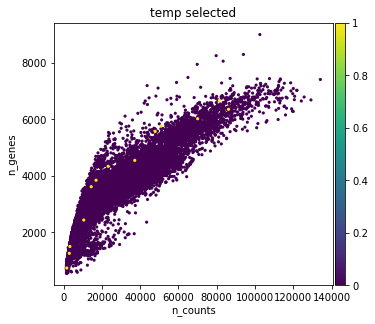

In [109]:
# recluster clusters that previously had less or more than 1 annotted cell type (exclusing NA and other).
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] if cell_type !='NA' and cell_type !='other']) == 0:
        print('**** Original cluster',cluster)
        res=0.4
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.2,nomain_threshold=0.8,
                     save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

In [118]:
# Correct entries in cluster_annotation dict - all clusters that do not have exactly one entry will be assigned 'NA'
# If cluster is to be removed add 'remove'

# Using higher resolution can not separate gamma and other cell in cluster 5 - thus the cluster was annotated as gamma
# Cluster 6 will be adjusted for cell cycle to try to resolve cell typs better
cluster_annotation['8_4']=['alpha_beta']
cluster_annotation['10_1']=['pericyte']
cluster_annotation['12_0']=['ductal']

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 4_3


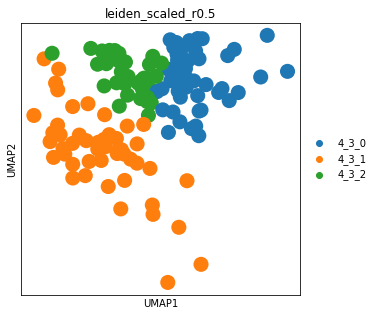


Cluster: 4_3_0 	size: 49
Present: ['alpha_delta']
alpha_delta               0.877551
alpha                     0.040816
alpha_delta_gamma         0.040816
alpha_gamma               0.020408
alpha_beta_delta_gamma    0.020408
Name: type_union, dtype: float64

Cluster: 4_3_1 	size: 48
Present: ['delta_gamma', 'other']
delta_gamma               0.541667
alpha_delta               0.125000
delta                     0.104167
alpha_beta_delta          0.083333
alpha_delta_gamma         0.083333
alpha_beta_delta_gamma    0.041667
gamma                     0.020833
Name: type_union, dtype: float64


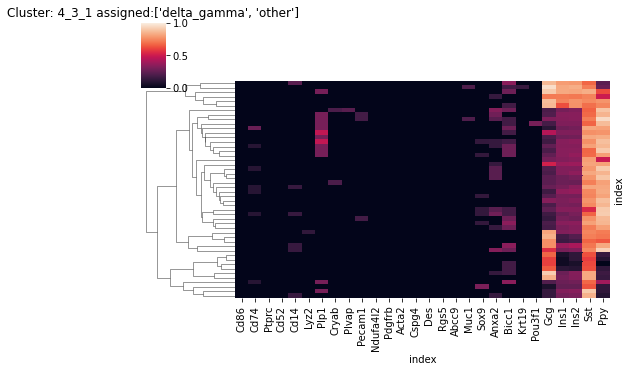

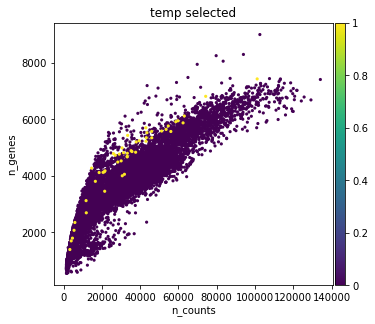

... storing 'leiden_scaled_r0.5' as categorical



Cluster: 4_3_2 	size: 35
Present: ['alpha_delta']
alpha_delta          0.857143
delta                0.085714
alpha_beta_delta     0.028571
alpha_delta_gamma    0.028571
Name: type_union, dtype: float64
**** Original cluster 4_4


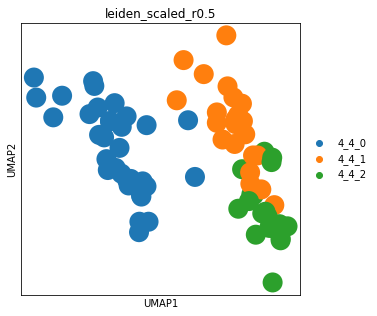


Cluster: 4_4_0 	size: 33
Present: ['delta', 'NA']
delta          0.666667
NA             0.272727
beta_delta     0.030303
delta_gamma    0.030303
Name: type_union, dtype: float64


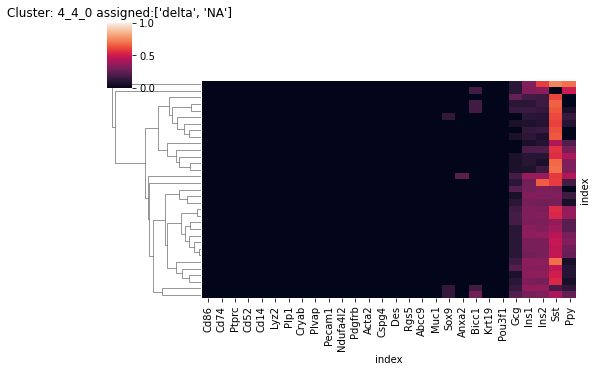

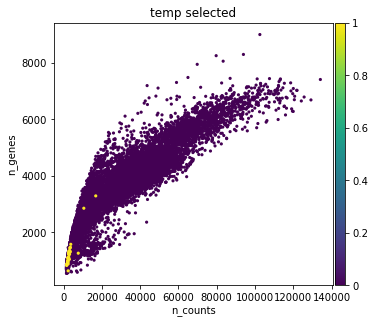


Cluster: 4_4_1 	size: 23
Present: ['beta_delta']
beta_delta          0.956522
alpha_beta_delta    0.043478
Name: type_union, dtype: float64

Cluster: 4_4_2 	size: 19
Present: ['beta_delta', 'other']
beta_delta          0.736842
delta               0.105263
NA                  0.052632
beta                0.052632
alpha_beta_delta    0.052632
Name: type_union, dtype: float64


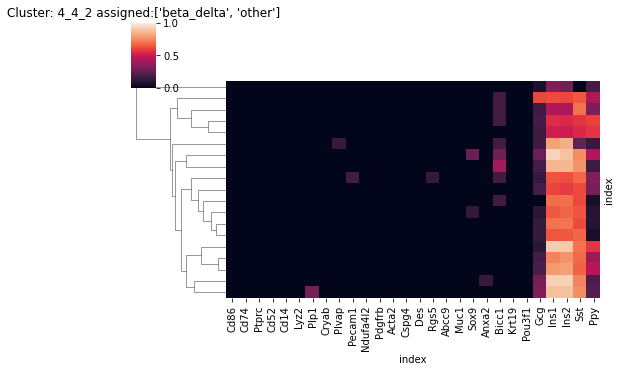

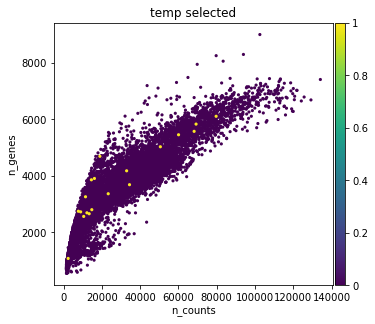

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 8_0


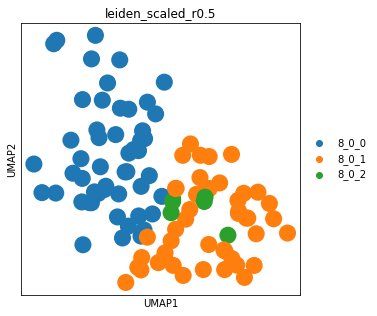


Cluster: 8_0_0 	size: 51
Present: ['gamma', 'alpha_gamma']
gamma          0.607843
alpha_gamma    0.294118
NA             0.058824
alpha          0.039216
Name: type_union, dtype: float64


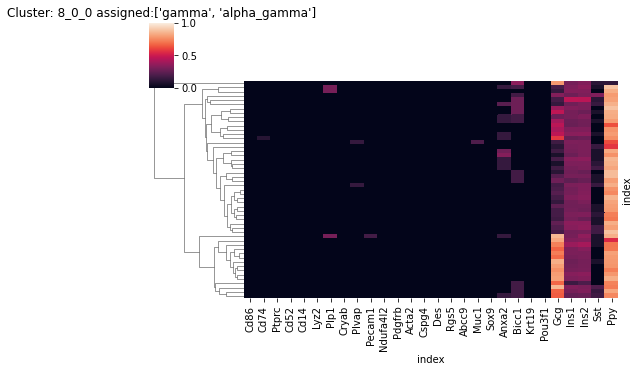

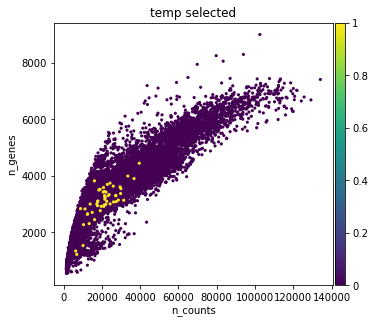

... storing 'leiden_scaled_r0.5' as categorical



Cluster: 8_0_1 	size: 46
Present: ['gamma']
gamma          0.847826
alpha_gamma    0.130435
alpha          0.021739
Name: type_union, dtype: float64

Cluster: 8_0_2 	size: 6
Present: ['gamma']
gamma    0.833333
NA       0.166667
Name: type_union, dtype: float64
**** Original cluster 8_2


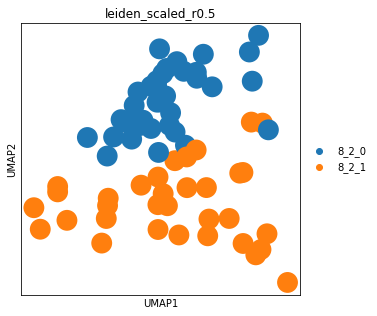


Cluster: 8_2_0 	size: 36
Present: ['alpha']
alpha          0.833333
alpha_gamma    0.166667
Name: type_union, dtype: float64

Cluster: 8_2_1 	size: 33
Present: ['alpha', 'other']
alpha          0.696970
alpha_gamma    0.181818
gamma          0.090909
NA             0.030303
Name: type_union, dtype: float64


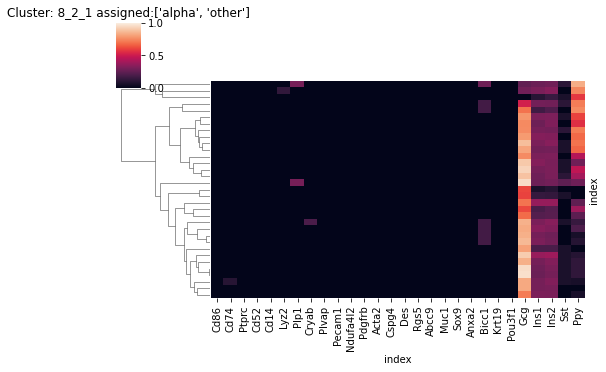

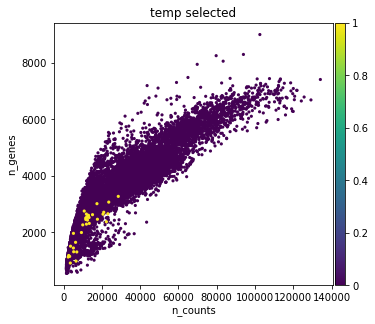

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 8_3


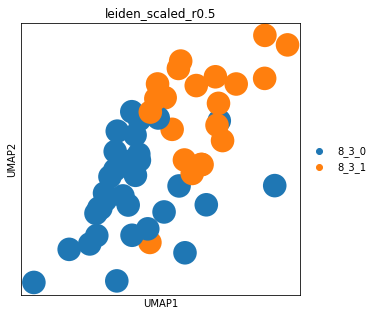


Cluster: 8_3_0 	size: 33
Present: ['alpha', 'other']
alpha    0.636364
NA       0.181818
gamma    0.151515
beta     0.030303
Name: type_union, dtype: float64


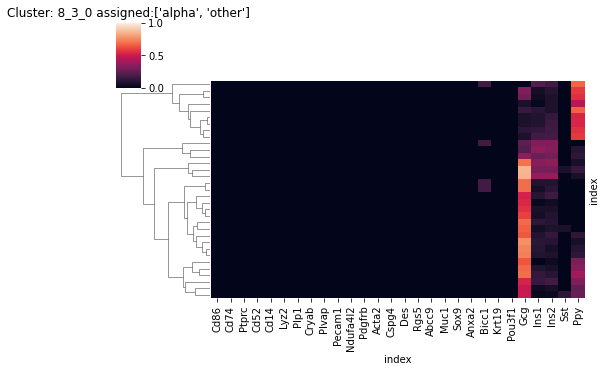

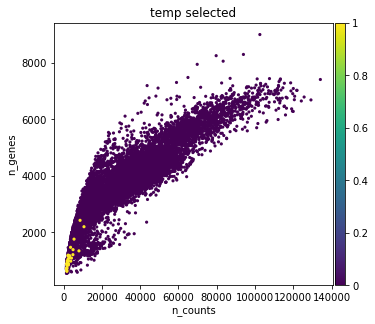

... storing 'leiden_scaled_r0.5' as categorical



Cluster: 8_3_1 	size: 21
Present: ['alpha']
alpha    0.952381
NA       0.047619
Name: type_union, dtype: float64
**** Original cluster 8_6


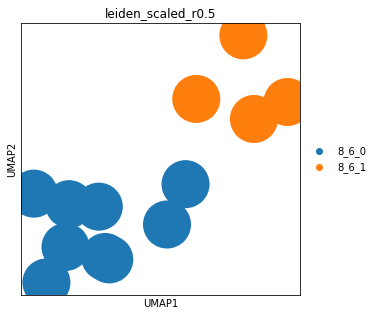


Cluster: 8_6_0 	size: 9
Present: ['NA', 'beta']
NA       0.444444
beta     0.333333
gamma    0.111111
delta    0.111111
Name: type_union, dtype: float64


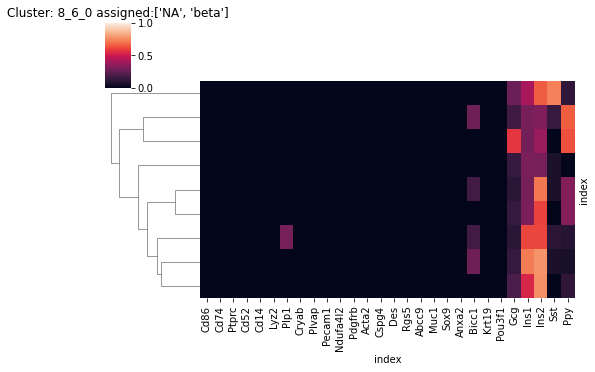

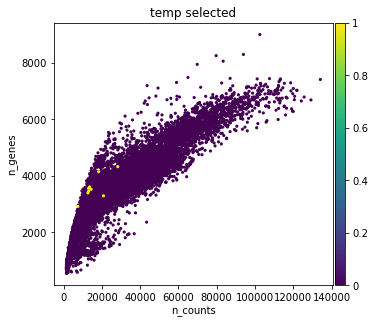


Cluster: 8_6_1 	size: 4
Present: ['gamma', 'alpha']
gamma    0.75
alpha    0.25
Name: type_union, dtype: float64


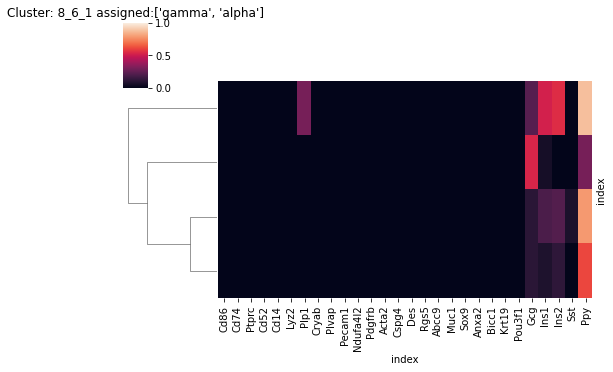

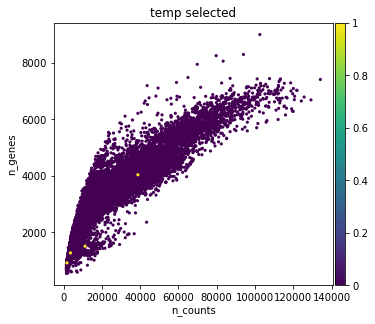

... storing 'leiden_scaled_r0.5' as categorical


**** Original cluster 10_3


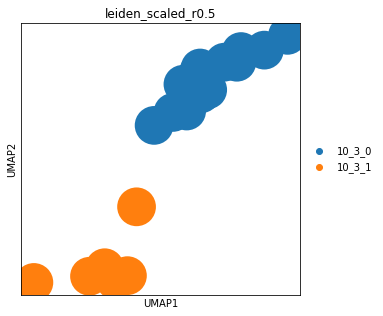


Cluster: 10_3_0 	size: 14
Present: ['pericyte_beta', 'schwann']
pericyte_beta     0.357143
schwann           0.214286
NA                0.142857
pericyte_alpha    0.142857
pericyte_gamma    0.071429
schwann_beta      0.071429
Name: type_union, dtype: float64


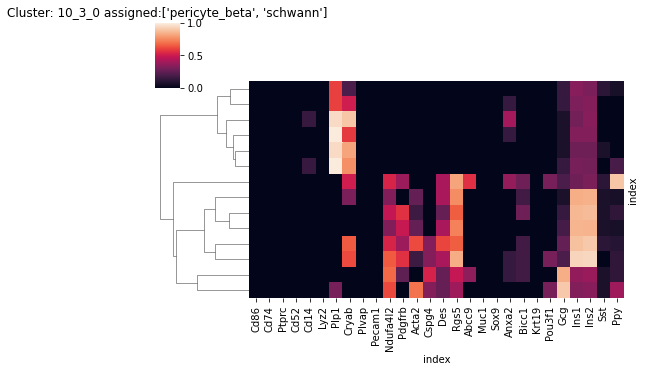

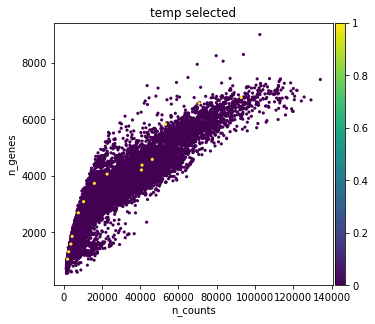


Cluster: 10_3_1 	size: 6
Present: ['endothelial_beta', 'beta']
endothelial_beta    0.666667
beta                0.333333
Name: type_union, dtype: float64


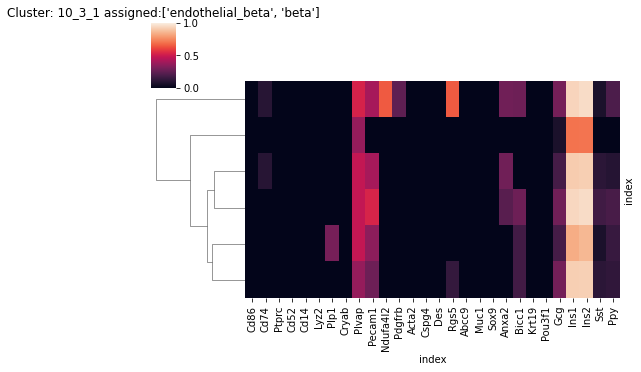

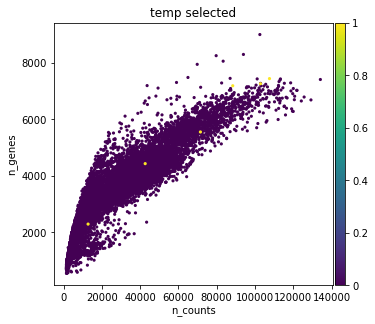

In [119]:
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] if cell_type !='NA' and cell_type !='other']) == 0:
        print('**** Original cluster',cluster)
        res=0.5
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.2,nomain_threshold=0.8,
                     save=False,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

#C: The above clustering could not resolve most clusters. However, it did resolve 10_3 to some extent thus this subcluster will be further subclustered.

... storing 'leiden_scaled_r0.8' as categorical


**** Original cluster 10_3


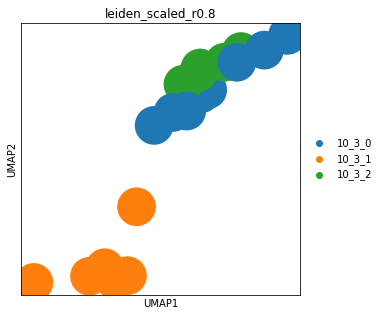


Cluster: 10_3_0 	size: 8
Present: ['pericyte_beta', 'pericyte_alpha']
pericyte_beta     0.625
pericyte_alpha    0.250
pericyte_gamma    0.125
Name: type_union, dtype: float64


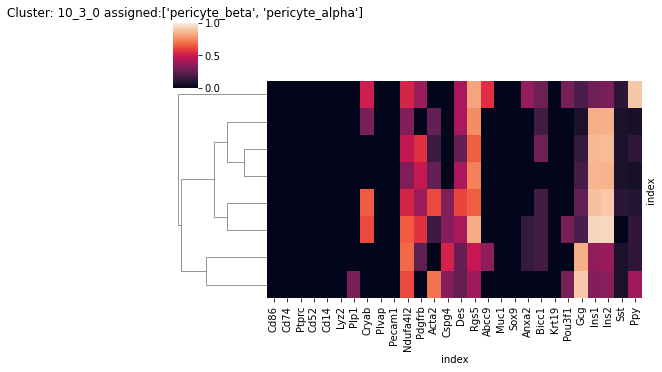

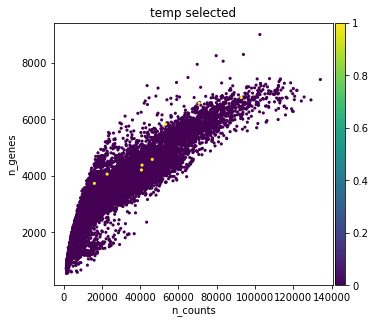


Cluster: 10_3_1 	size: 6
Present: ['endothelial_beta', 'beta']
endothelial_beta    0.666667
beta                0.333333
Name: type_union, dtype: float64


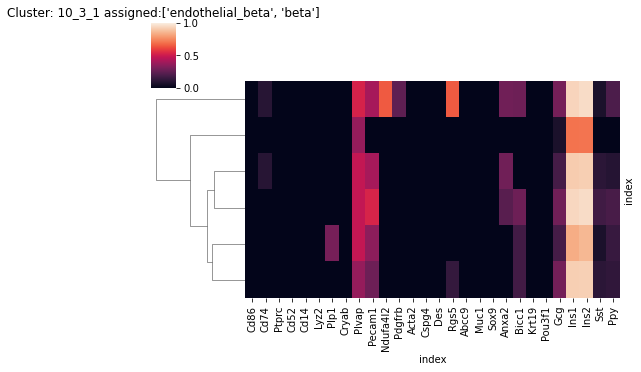

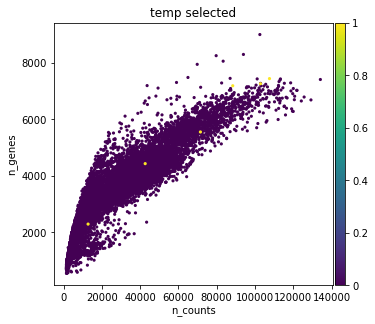


Cluster: 10_3_2 	size: 6
Present: ['schwann', 'NA']
schwann         0.500000
NA              0.333333
schwann_beta    0.166667
Name: type_union, dtype: float64


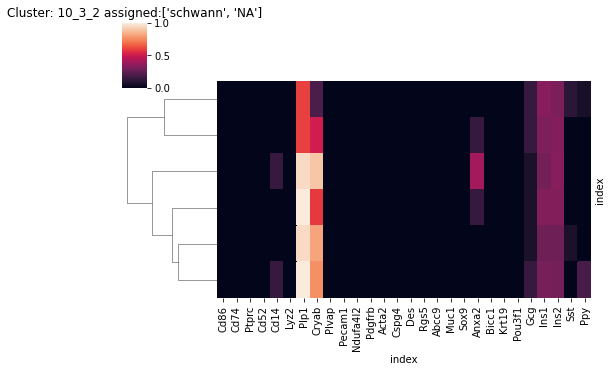

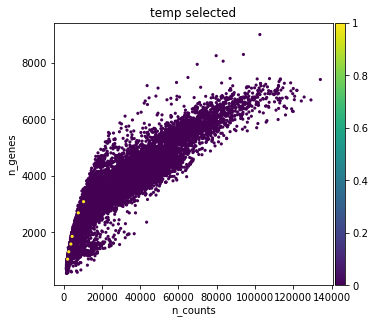

In [121]:
for cluster in ['10_3']:
    if len(cluster_annotation[cluster]) != 1 or len(
        [cell_type for cell_type in cluster_annotation[cluster] if cell_type !='NA' and cell_type !='other']) == 0:
        print('**** Original cluster',cluster)
        res=0.8
        adata_temp,assignment_df_temp=get_cluster_data(adata_original=adata_rawnormalised, cluster=cluster,
                                                       cluster_col='cluster',assignment_df=assignment_df)
        subcluster(adata_cluster=adata_temp,res=res,original_cluster=cluster,assignment_df_temp=assignment_df_temp)
        cluster_annotate(assignment_df=assignment_df_temp,
                         cluster_col='leiden_scaled_r'+str(res),
                         # Use more leanient condition as this is already subclustered - 
                        # otherwise data could be in some cases subclustered almost idefinitely
                         present_threshold=0.2,nomain_threshold=0.8,
                     save=True,cluster_annotation=cluster_annotation,adata_main= adata_rawnormalised)

In [122]:
cluster_annotation['10_3_0']=['pericyte']
cluster_annotation['10_3_1']=['endothelial']
cluster_annotation['10_3_2']=['schwann']

#### Annotate cells from unsolvable clusters based on cell type score threshold
All those clusters are endocrine so strip any non-endocrine annotations from cell names.

In [123]:
# Get clusters that still do not have single cell type annotation
unsolvable=[]
for cluster in sorted(list(adata_rawnormalised.obs['cluster'].unique()),key=int):
    if len(cluster_annotation[cluster]) != 1:
        unsolvable.append(cluster)
print('Unsolvable clusters:',unsolvable)        

Unsolvable clusters: ['4_3', '4_4', '8_0', '8_2', '8_3', '8_6']


In [124]:
# Get all cells from the clusters 
idx_unsolvable=adata_rawnormalised.obs.query('cluster in @unsolvable').index

In [125]:
# Make new assignments with only endocrine cell types (excluding epsilone)
type_unions=[]
for idx in idx_unsolvable:
    row=assignment_df.loc[idx,:]
    type_union=''
    # Use list comprehension instead of just the endocrine list so that names of cell types stay in the same order as above
    for col in [col for col in row.index if col in ['alpha','beta','delta','gamma']]:
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions.append(type_union.rstrip('_'))

#Reasign cell types in assignment_df
assignment_df.loc[idx_unsolvable,'type_union']=type_unions

alpha N: 100


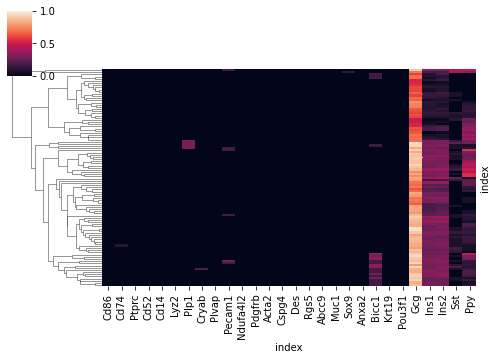

alpha_delta N: 79


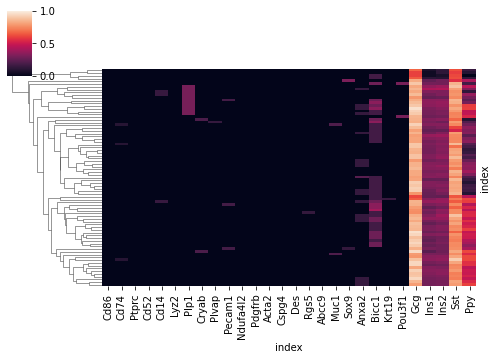

gamma N: 88


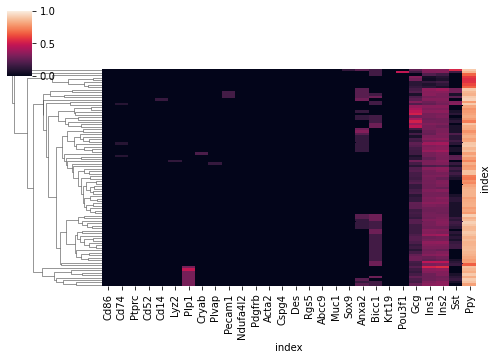

beta_delta N: 37


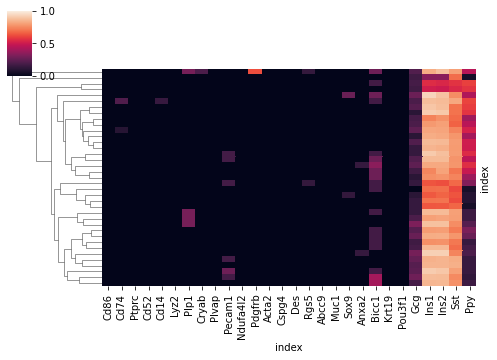

alpha_beta_delta_gamma N: 3


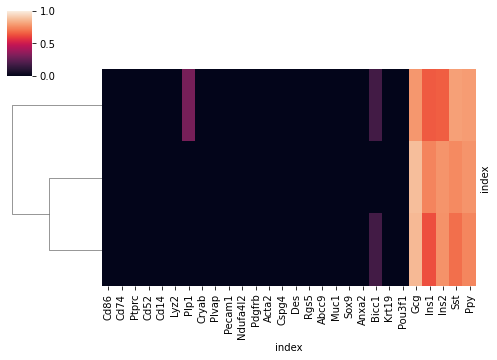

alpha_beta_delta N: 7


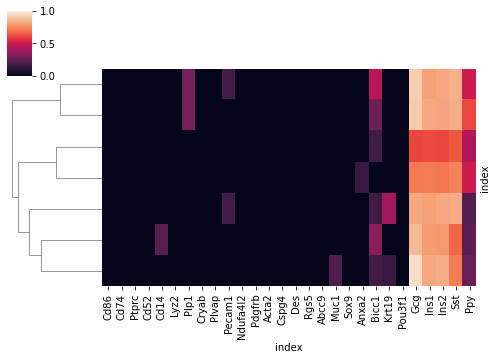

delta_gamma N: 27


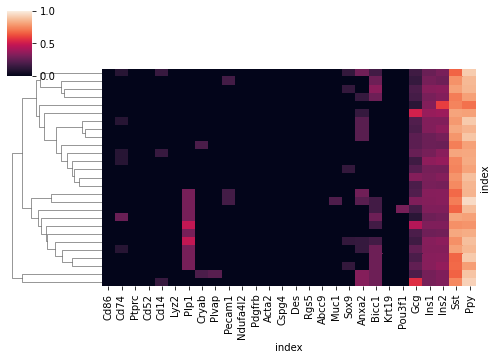

alpha_gamma N: 34


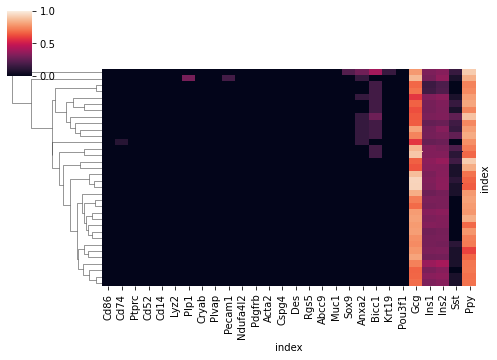

delta N: 33


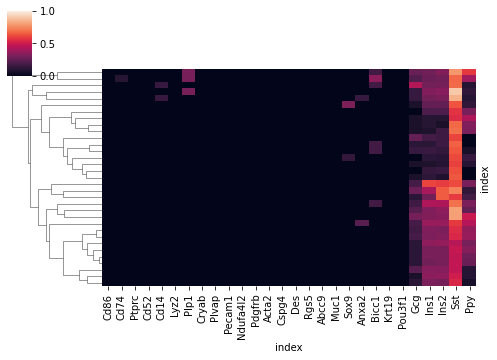

NA N: 26


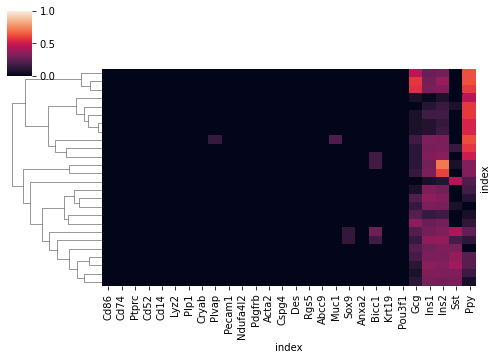

alpha_delta_gamma N: 7


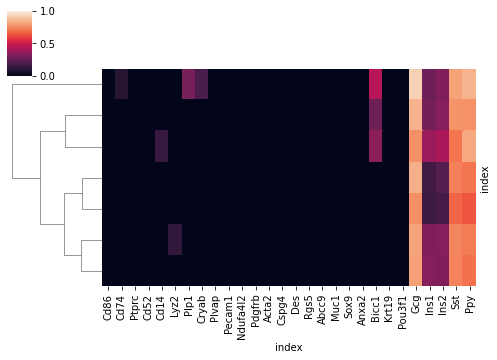

beta N: 5


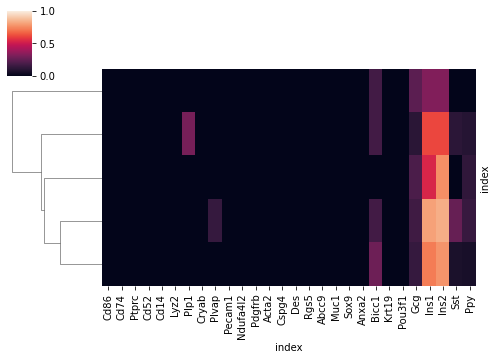

In [126]:
# Group unsolvable cells by cell type and plot expression to check if assignment was ok
for cell_type in assignment_df.loc[idx_unsolvable,'type_union'].unique():
    type_idx=assignment_df.loc[idx_unsolvable,:].query('type_union == "'+cell_type+'"').index
    print(cell_type,'N:',len(type_idx))
    row_cluster=True
    if len(type_idx)<2:
        row_cluster=False
    sb.clustermap(pd.DataFrame(scaled_expression.loc[type_idx,:]), 
                  row_cluster=row_cluster, col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5),vmin=0,vmax=1)
    plt.show()
    time.sleep(1.0)

In [127]:
# Replace cluster names in adata and cluster_annotation with threshold based annotation
for cell_type in assignment_df.loc[idx_unsolvable,'type_union'].unique():
    # Subset assignment_df to idx_unsolvable before extracting idices of each cell type so that 
    # Cells from other clusters to not get assigned new clusters because they share phenotype
    type_idx=assignment_df.loc[idx_unsolvable,:].query('type_union == "'+cell_type+'"').index
    save_cluster_annotation(adata=adata_rawnormalised,cluster_name=cell_type,cell_types=[cell_type],cell_names=type_idx)

#### Add cluster based annotation to adata

In [128]:
# Display cluster annotation of clusters that will be used
clusters=list(adata_rawnormalised.obs['cluster'].unique())
clusters.sort()
for cluster in clusters:
    print(cluster ,cluster_annotation[cluster ])

0 ['beta']
1 ['beta']
10_0 ['pericyte']
10_1 ['pericyte']
10_2 ['pericyte']
10_3_0 ['pericyte']
10_3_1 ['endothelial']
10_3_2 ['schwann']
11 ['ductal']
12_0 ['ductal']
2 ['beta']
3 ['alpha']
4_0 ['delta']
4_1 ['delta']
4_2 ['delta']
5 ['beta']
6 ['beta']
7_0 ['endothelial']
7_1 ['endothelial']
7_2 ['endothelial']
7_3 ['endothelial']
7_4 ['endothelial']
7_5 ['endothelial_pericyte']
8_1 ['gamma']
8_4 ['alpha_beta']
8_5 ['gamma']
9 ['immune']
NA ['NA']
alpha ['alpha']
alpha_beta_delta ['alpha_beta_delta']
alpha_beta_delta_gamma ['alpha_beta_delta_gamma']
alpha_delta ['alpha_delta']
alpha_delta_gamma ['alpha_delta_gamma']
alpha_gamma ['alpha_gamma']
beta ['beta']
beta_delta ['beta_delta']
delta ['delta']
delta_gamma ['delta_gamma']
gamma ['gamma']


In [129]:
# Add cell type annotation to clusters. 
# If clusters was annotated with more than one cell type (inbcluding NA or other) set it to 'NA'.
if 'cell_type' in adata_rawnormalised.obs.columns:
    adata_rawnormalised.obs.drop('cell_type',axis=1,inplace=True)
for row_idx in adata_rawnormalised.obs.index:
    cluster=adata_rawnormalised.obs.at[row_idx,'cluster']
    cell_type=cluster_annotation[cluster]
    if len(cell_type)!=1:
        cell_type='NA'
    else:
        cell_type=cell_type[0]
        
    add_category(df=adata_rawnormalised.obs,idxs=row_idx,col='cell_type',category=cell_type)

### Cell type annotation evaluation

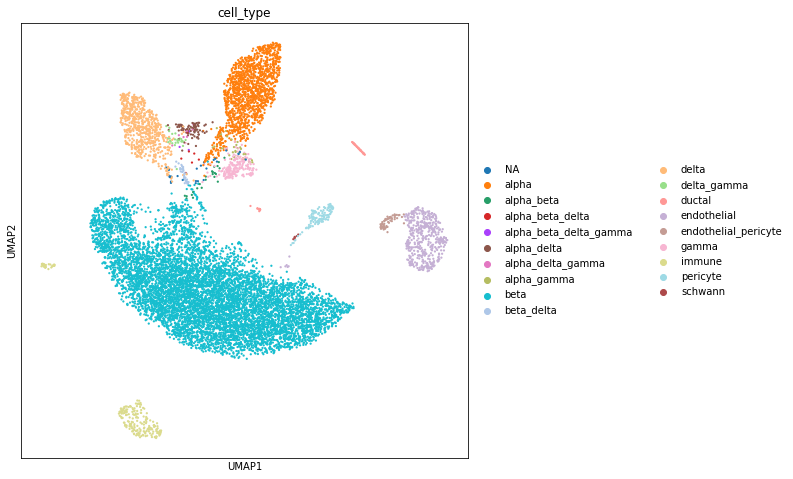

In [131]:
# Plot cell types on UMPA (pre-annotated and new ones)
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_rawnormalised, color=['cell_type'], size=20, use_raw=False,wspace=0.3)

In [132]:
# Count of new cell types
adata_rawnormalised.obs.cell_type.value_counts()

beta                      7822
alpha                     1370
delta                      645
endothelial                470
immune                     223
gamma                      198
pericyte                   122
alpha_delta                 79
endothelial_pericyte        60
ductal                      55
beta_delta                  37
alpha_gamma                 34
delta_gamma                 27
NA                          26
alpha_beta                  23
alpha_beta_delta             7
alpha_delta_gamma            7
schwann                      6
alpha_beta_delta_gamma       3
Name: cell_type, dtype: int64

Text(0.5, 1.0, 'cell_type')

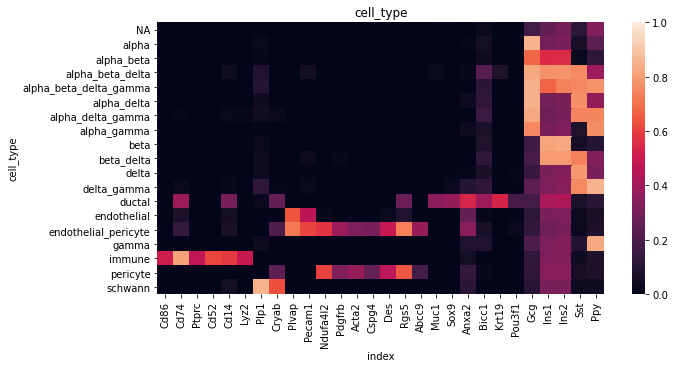

In [134]:
# Plot mean marker expression in each cluster
rcParams['figure.figsize']=(10,5)
#fig,ax=plt.subplots()
#sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['pre_cell_type']).mean(),yticklabels=1,xticklabels=1,
#          vmin=0,vmax=1)
#ax.set_title('pre_cell_type')
fig,ax=plt.subplots()
sb.heatmap(scaled_expression.groupby(adata_rawnormalised.obs['cell_type']).mean(),yticklabels=1,xticklabels=1,
          vmin=0,vmax=1)
ax.set_title('cell_type')

Expression of markers in individual NA cells.

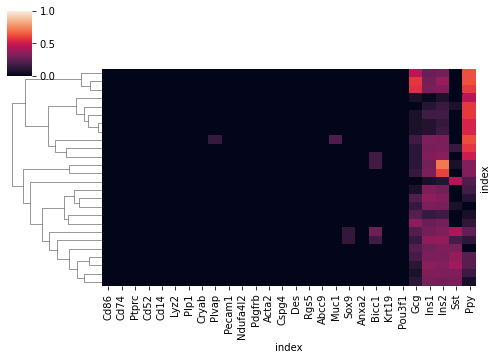

In [137]:
# Subset marker expression to NA cell type cells and plot heatmap
sb.clustermap(pd.DataFrame(scaled_expression[adata_rawnormalised.obs.cell_type=='NA']), 
                  row_cluster=True, col_cluster=False,xticklabels=1,yticklabels=False,figsize=(7,5),vmin=0,vmax=1)

QC metrics in each cell type.

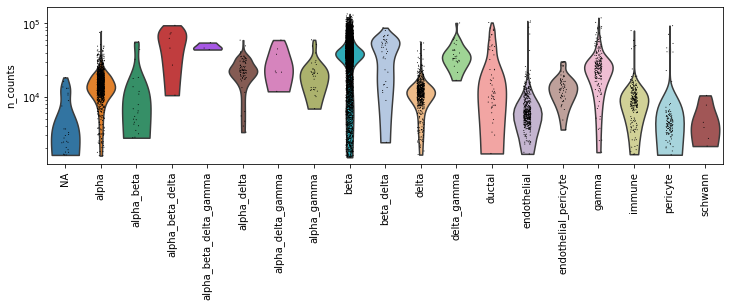

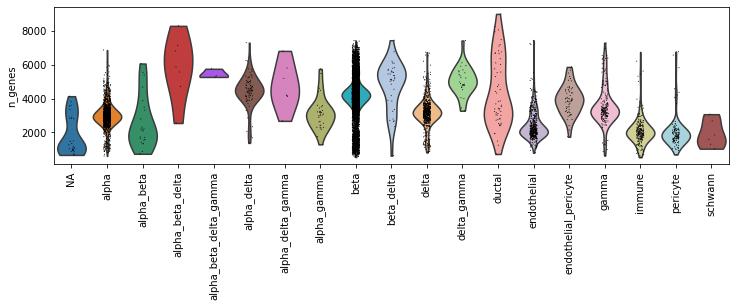

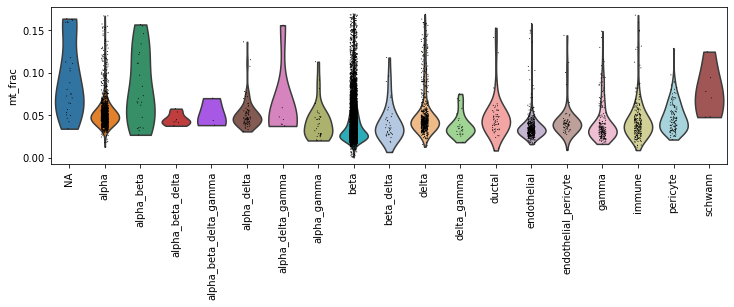

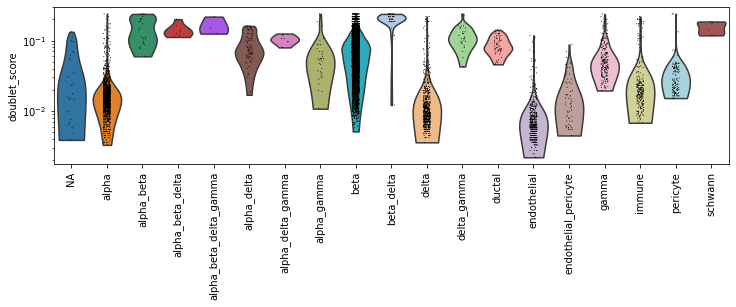

In [139]:
# QC metrics per cell type
rcParams['figure.figsize']=(10,3)
sc.pl.violin(adata_rawnormalised, ['n_counts'], groupby='cell_type', size=1, log=True,rotation=90)
sc.pl.violin(adata_rawnormalised, ['n_genes'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata_rawnormalised, ['mt_frac'], groupby='cell_type', size=1, log=False,rotation=90)
sc.pl.violin(adata_rawnormalised, 'doublet_score',groupby='cell_type',size=1, log=True,rotation=90)

Add celly type data to original adata for saving.

In [140]:
# Add cell type to adata
adata.obs['cell_type']=adata_rawnormalised.obs.cell_type
# Add final clusters and starting clusters to adata
adata.obs[['cluster',clusters_col]]=adata_rawnormalised.obs[['cluster',clusters_col]]
# Add cell type scores
score_cols=[col for col in scores_df_norm.columns if '_score' in col]
adata.obs[score_cols]=scores_df_norm[score_cols].reindex(adata.obs.index)

#### Cell type markers

Upregulated genes in each cell type compared to other cells on normalised log scaled data.

In [141]:
# Compute overexpressed genes in each cell type on normalised log scaled data
#Retain only cell types with >=10 cells and non-NA annotation
groups_counts=adata.obs.cell_type.value_counts()
groups=[cell_type for cell_type in groups_counts[groups_counts>=10].index if cell_type!='NA']
# Compute markers
sc.tl.rank_genes_groups(adata,groupby='cell_type',groups=groups, use_raw=False)
sc.tl.filter_rank_genes_groups(adata,groupby='cell_type', use_raw=False)

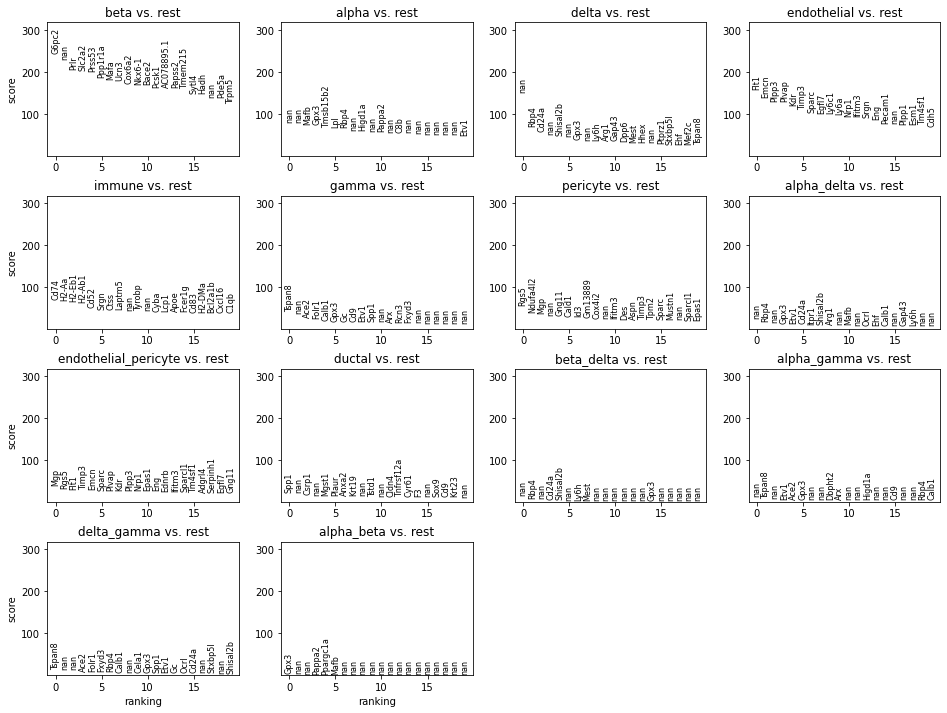

In [142]:
# Plot cell_type vs rest upregulated genes
rcParams['figure.figsize']=(4,3)
sc.pl.rank_genes_groups(adata,key='rank_genes_groups_filtered')

Expression of upregulated genes on normalised log transformed z-scaled data

categories: NA, alpha, alpha_beta, etc.
var_group_labels: beta, alpha, delta, etc.


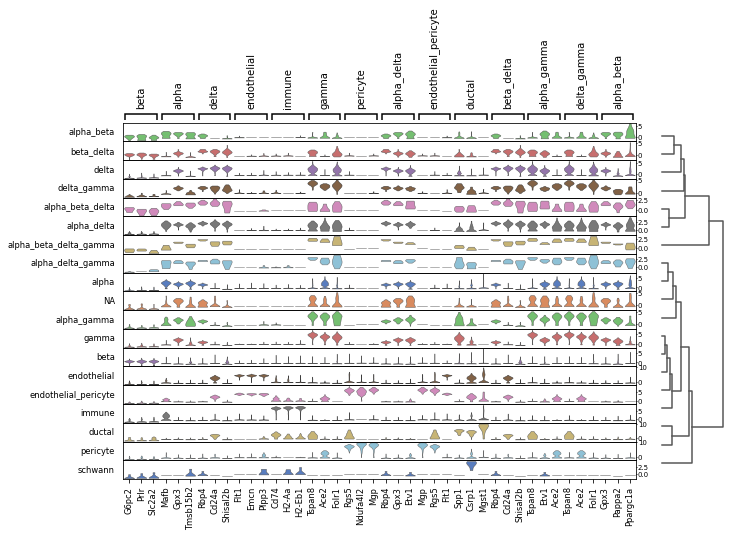

In [143]:
# Plot expression of cell type upregulated genes on normalised log transformed z-scaled data
adata_scl.uns['rank_genes_groups_filtered']=adata.uns['rank_genes_groups_filtered']
adata_scl.obs['cell_type']=adata.obs['cell_type']
sc.pl.rank_genes_groups_stacked_violin(adata_scl,key='rank_genes_groups_filtered',n_genes=3,use_raw=False)

### Expected doublet rates

Adapted from https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6126471/#ref-7, but using 0.1 as doublet rate (described in my notes).

Expected multiplet number is calculated for each file separately.

In [11]:
# Singlet cell types whose multiplet rates are predicted
cell_types=['alpha','beta','gamma','delta']
# DFs with expected multiplet rates
expected_dfs=[]
# Calculate expected rate for each file separately
for file in adata.obs.file.unique():
    print('\nFile:',file)
    # Exclude some endocrine cells as they form completely separate populations 
    # with no multiplets in neighbourhood)
    exclude_types=[]
    cell_type_temp=adata.obs.query('file == "'+file+'" & cell_type not in @exclude_types').cell_type.copy()
    
    # N of droplets containing at least one cell of the relevant cell type
    Ns=dict()
    for cell_type in cell_types:
        n_celltype=cell_type_temp.str.contains(cell_type).sum()
        Ns[cell_type]=n_celltype
    print('N droplets that contain at least one:',Ns)
    
    # Calculate N (see formula in notes)
    N=emr.get_N(Ns=Ns.values())
    regex_any='|'.join(['.*'+cell_type+'.*' for cell_type in cell_types])
    print('N:',round(N,1), '(observed cell-containing N with relevant cell types:',
          cell_type_temp.str.contains(fr'{regex_any}').sum(),')')
    
    # Calculate mu for each cell type
    mus=dict()
    for cell_type in cell_types:
        mus[cell_type]=emr.mu_cell_type(N_cell_type=Ns[cell_type], N=N)
    print('mu:',{k:round(v,4) for k,v in mus.items()})
    
    # Extract multiplet types and their components
    multiplet_types=dict()
    for cell_type in cell_type_temp.unique():
        # Get components of multiplets by retaining name parts contained in original cell type dict
        components_all=cell_type.split('_')
        components_relevant=[type_singlet for type_singlet in components_all if type_singlet in cell_types]
        if len(components_relevant) > 1:
            multiplet_types[cell_type]=components_relevant
            # This does not assure that initially the cell types are not counted wrongly 
            # (e.g. including proliferative, ...)
            #if len(components_relevant) < len(components_all):
            #    warnings.warn('Multiplet type has additional unrecognised component: '+cell_type)
    #print('Relevant multiplet cell types:',multiplet_types.keys())
    
    # This also analyses O and E of singlet types, but this is not so relevant as changes in multiplets also 
    # affect it?
    #types_OE= dict(zip(cell_types,[[i] for i in cell_types]))
    #types_OE.update(multiplet_types)
    
    # Calculate O (observed) and E (expected) numbers
    expected_df=pd.DataFrame(index=multiplet_types.keys(),columns=['O_'+file,'E_'+file
                                                                  # ,'E_atleast'
                                                                  ])
    #for multiplet, components in types_OE.items():
    for multiplet, components in multiplet_types.items():
        absent=np.setdiff1d(cell_types,components)
        # N of cellls of this cell type
        expected_df.at[multiplet,'O_'+file]=(cell_type_temp==multiplet).sum()
        # Expected N of cells that have all the individual cell types of multiplet and non of the other 
        # considered possible multiplet ontributors
        expected_df.at[multiplet,'E_'+file]=emr.expected_multiplet(
            mu_present=[mus[cell_type] for cell_type in components], 
            mu_absent=[mus[cell_type] for cell_type in absent], 
            N=N)
        # E that droplet contains at least one cell of each present cell type,
        # but does not exclude other cell types from being present
        #expected_df.at[multiplet,'E_atleast']=emr.expected_multiplet(
        #    mu_present=[mus[cell_type] for cell_type in components], 
        #    mu_absent=[], 
        #    N=N)
    expected_dfs.append(expected_df)
    
# Merge O/E rates for all files into single DF
display(pd.concat(expected_dfs,axis=1))
del cell_type_temp


File: MUC13633
N droplets that contain at least one: {'alpha': 814, 'beta': 3704, 'gamma': 171, 'delta': 409}
N: 11160.3 (observed cell-containing N with relevant cell types: 4944 )
mu: {'alpha': 0.0757, 'beta': 0.4033, 'gamma': 0.0154, 'delta': 0.0373}

File: MUC13634
N droplets that contain at least one: {'alpha': 709, 'beta': 4188, 'gamma': 98, 'delta': 396}
N: 12001.7 (observed cell-containing N with relevant cell types: 5308 )
mu: {'alpha': 0.0609, 'beta': 0.4292, 'gamma': 0.0082, 'delta': 0.0336}


,O_MUC13633,E_MUC13633,O_MUC13634,E_MUC13634
alpha_delta,51,19.6251,28,15.1061
beta_delta,26,123.914,11,128.959
alpha_beta_delta_gamma,3,0.151699,NaN,NaN
alpha_beta_delta,5,9.74894,2,8.09656
delta_gamma,15,3.8815,12,1.98083
alpha_gamma,21,8.02743,13,3.64478
alpha_beta,14,256.27,9,237.289
alpha_delta_gamma,4,0.305377,3,0.124364


#C: Both alpha_beta_delta_gamma and alpha_delta_gamma have very low counts, but O >> E. However, ABDG will be marked as multiplet and ADG not, based on statistics from other studies annotated in the same way. Also, ABDG is missing in one sample, making the assignment less reliable. 

In [12]:
# Reassign cell types to multiplet
multiplets=['beta_delta','alpha_beta_delta_gamma','alpha_beta_delta','alpha_beta']
adata.obs['cell_type_multiplet']=adata.obs.cell_type.replace(multiplets, 'multiplet')

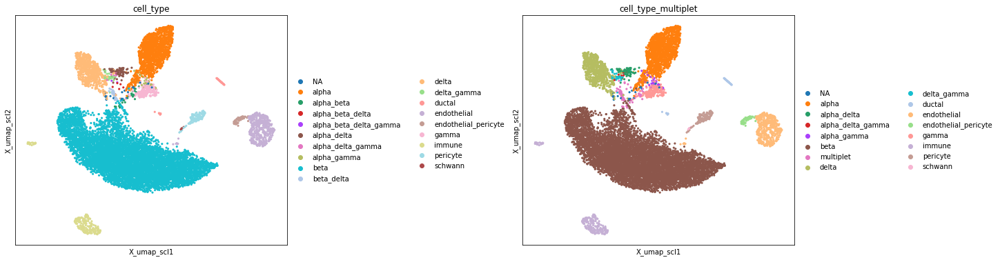

In [13]:
# Plot new cell types
rcParams['figure.figsize']=(6,6)
sc.pl.embedding(adata,'X_umap_scl', color=['cell_type','cell_type_multiplet'], size=40, use_raw=False,wspace=0.7)

## Resolve beta subtypes

#### Preprocess beta cell data

Select beta cells only

In [8]:
[ct for ct in adata.obs.cell_type_multiplet.unique() if 'beta' in ct]

['beta']

#C: No beta str containing cell types to exclude

In [8]:
# Subset adata
selected_beta=[ct for ct in adata.obs.cell_type_multiplet.unique() if 'beta' in ct]
adata_beta=adata[adata.obs.cell_type.isin(selected_beta),:].copy()
adata_beta.shape

# Normalise raw data for plotting and cell type scoring
adata_raw_beta=adata_beta.raw.to_adata().copy()
# Normalize and log transform
adata_raw_beta.X /= adata_raw_beta.obs['size_factors'].values[:,None] # This reshapes the size-factors array
sc.pp.log1p(adata_raw_beta)
adata_raw_beta.X = sparse.csr_matrix(np.asarray(adata_raw_beta.X))

# Scale beta adata for umap
adata_scl_beta=adata_beta
del adata_beta
sc.pp.scale(adata_scl_beta,max_value=10)
sc.pp.pca(adata_scl_beta, n_comps=10, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata_scl_beta,n_pcs=10)
sc.tl.umap(adata_scl_beta)

# Combine raw and X data
adata_rawnormalised_beta=adata_scl_beta.copy()
adata_rawnormalised_beta.raw=adata_raw_beta
del adata_raw_beta

/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:121: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['distances'] = neighbors.distances
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/neighbors/__init__.py:122: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'] = neighbors.connectivities
/home/icb/karin.hrovatin/miniconda3/envs/rpy2_3/lib/python3.8/site-packages/scanpy/tools/_umap.py:147: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adata.uns['neighbors']['connectivities'

#### Check markers

('beta', '/')
Missing genes: []


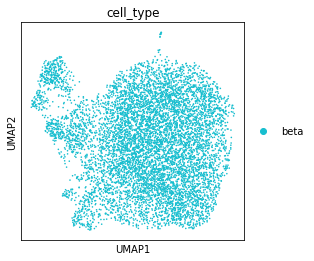

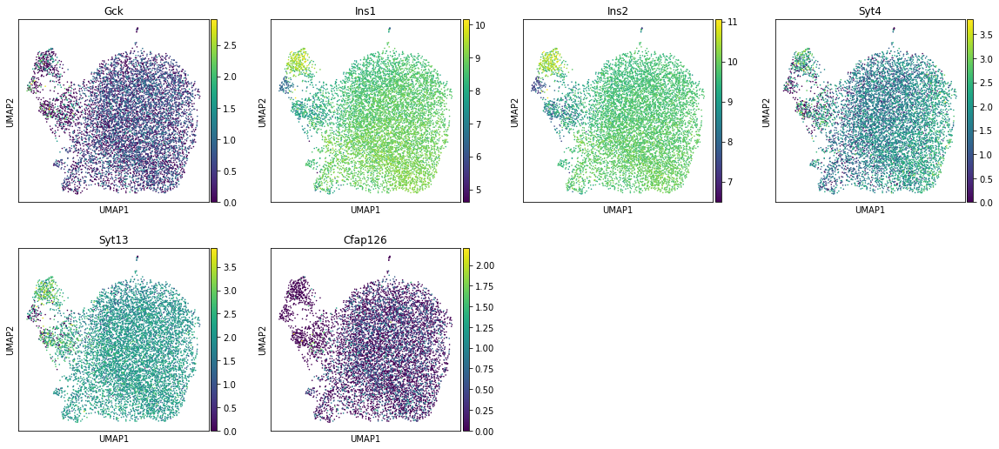

('beta', 'aging')
Missing genes: []


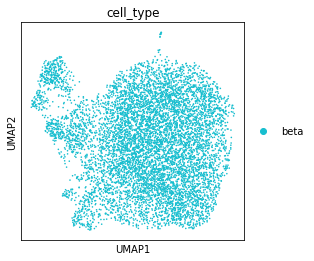

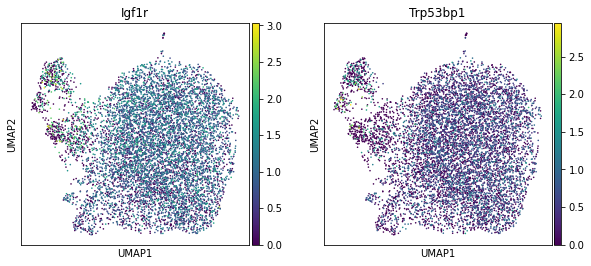

('beta', 'dedifferentiated')
Missing genes: []


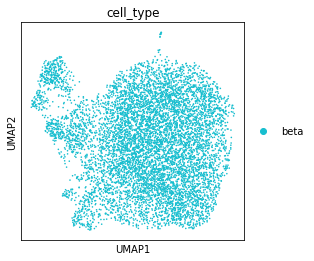

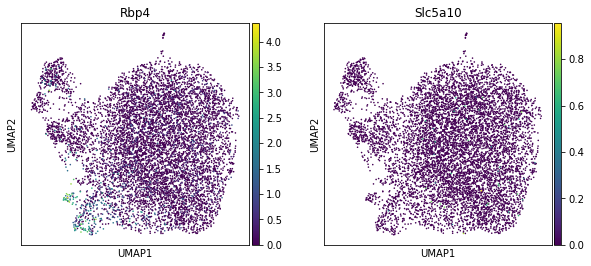

('beta', 'disease')
Missing genes: []


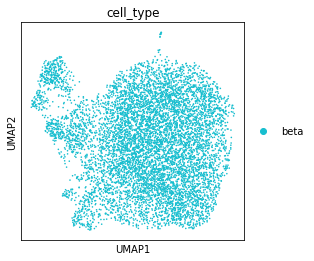

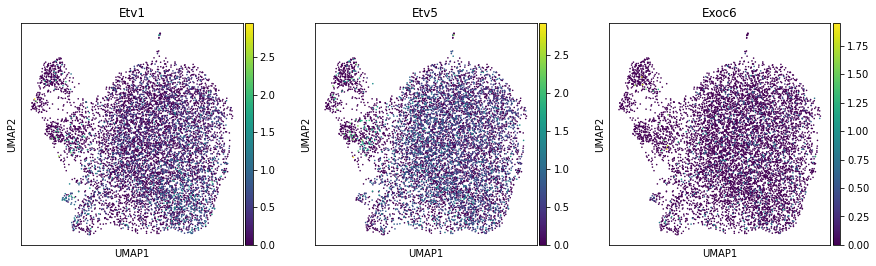

('beta', 'immature')
Missing genes: ['Pax4']


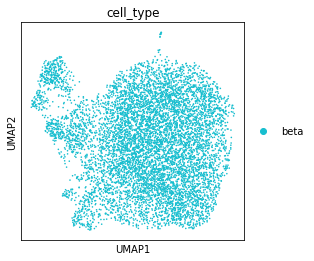

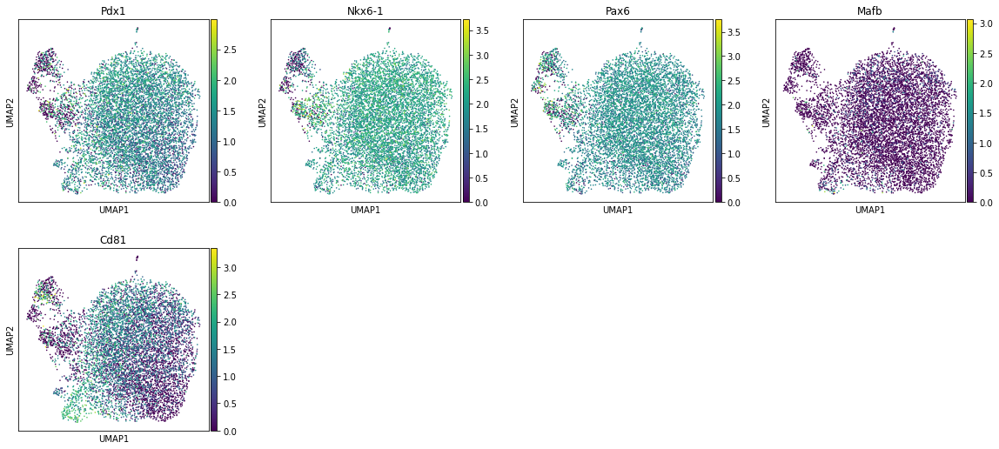

('beta', 'inflamation')
Missing genes: []


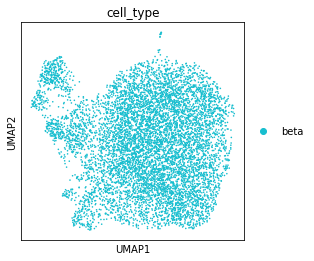

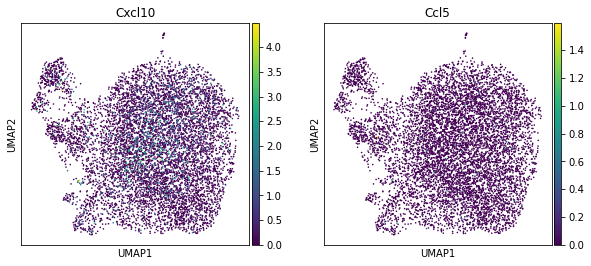

('beta', 'mature')
Missing genes: []


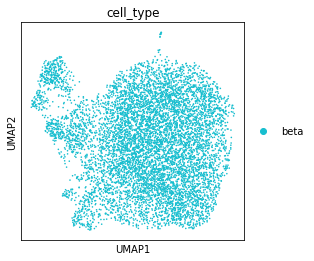

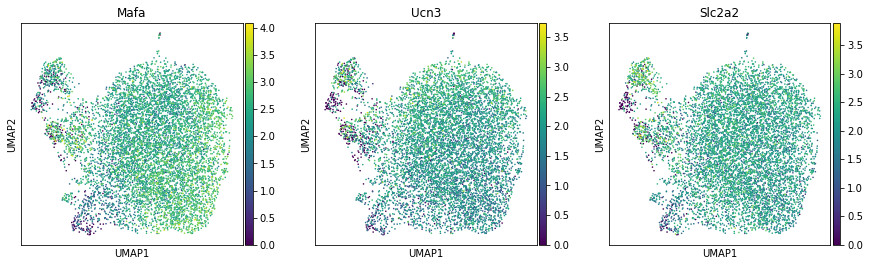

('beta', 'senescent')
Missing genes: []


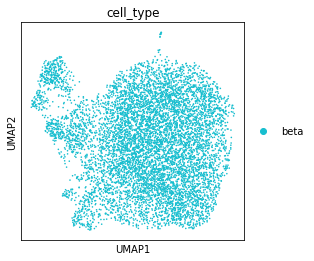

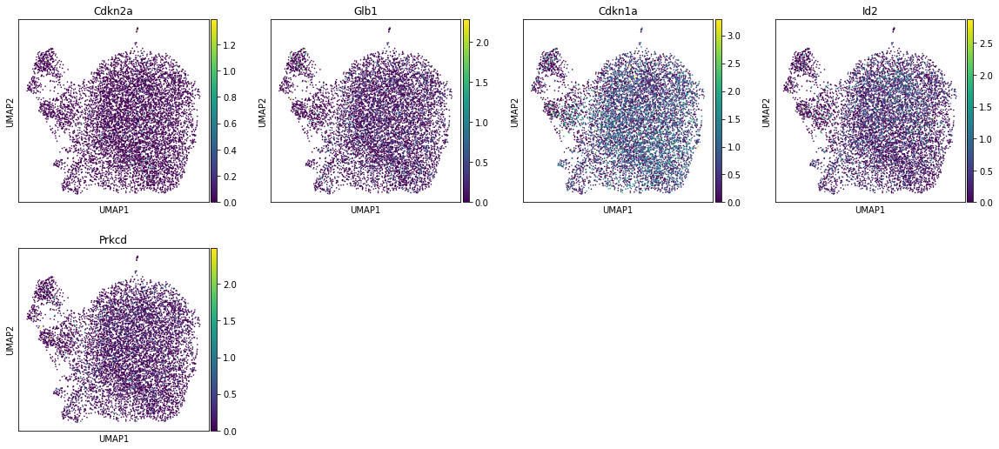

('endocrine', '/')
Missing genes: ['Neurod2']


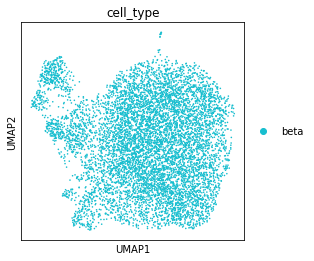

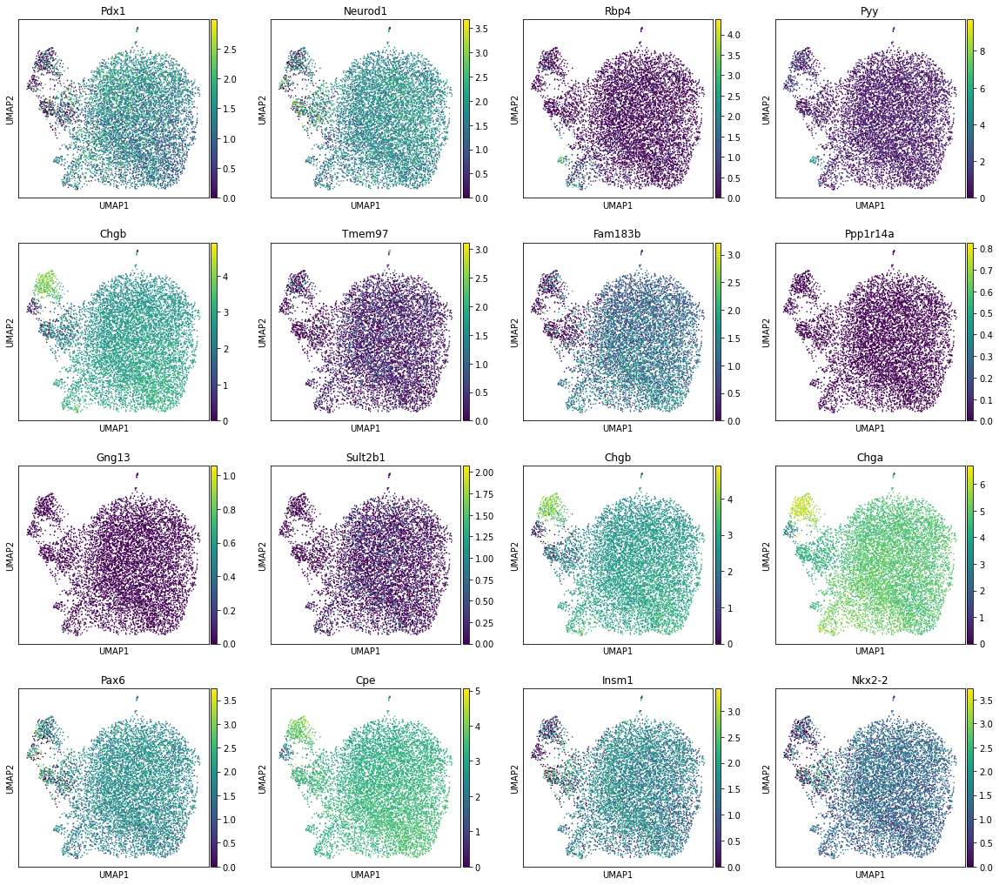

In [8]:
# Select beta and endocrine markers and group by cell type and subtype
for group_name, group in markers.query('Cell in ["beta","endocrine"]').fillna('/').groupby(['Cell','Subtype']):
    print(group_name)
    genes=group.Gene
    # Retain genes present in raw var_names
    missing=[gene for gene in genes if gene not in adata.raw.var_names]
    genes=[gene for gene in genes if gene in adata.raw.var_names]
    print('Missing genes:',missing)
    rcParams['figure.figsize']=(4,4)
    sc.pl.umap(adata_rawnormalised_beta, color=['cell_type'],size=10, use_raw=True)
    sc.pl.umap(adata_rawnormalised_beta, color=genes ,size=10, use_raw=True)

#C: Pdx1 and Nkx6-1 will not be annotated as they are expressed similarly as in other studies (despite having a pattern here) where they do not show specific pattern. Thus using them as markers would lead to inconsitent annotation across studies. Chgb is here coexpressed with Chga (different from Fltp_2y). There is a subpopulation that is mature low and immature low. However, this subpopulation is low for many other markers as well, possibly indicating lower count population. It will be checked if this is indeed immature&mature low on scatterplot of scores.

In [9]:
# Selected markers that seem to be able to distinguish between cell seubtypes
markers_selection_beta={
'Cd81_high':['Cd81'],
'Cxcl10_high':['Cxcl10'],
'mature':['Mafa','Ucn3','Slc2a2'],
'immature':['Rbp4','Pyy'],
'Chga_Chgb_high':['Chga','Chgb'],
'ins_high':['Ins1','Ins2']
}

#### Calculate subpopulation scores

In [10]:
# Calculate scores
scores=[]
for cell_type,genes in markers_selection_beta.items():
    score_name=cell_type+'_score'
    scores.append(cell_type+'_score')
    sc.tl.score_genes(adata_rawnormalised_beta, gene_list=genes, score_name=score_name,  use_raw=True)

In [11]:
# Scores normalised to interval [0,1] for each cell type - so that they can be more easily compared
scores_df_norm_beta=adata_rawnormalised_beta.obs[scores]
scores_df_norm_beta=pd.DataFrame(pp.minmax_scale(scores_df_norm_beta),columns=scores_df_norm_beta.columns,index=adata_rawnormalised_beta.obs.index)

#### Score distn and relationships

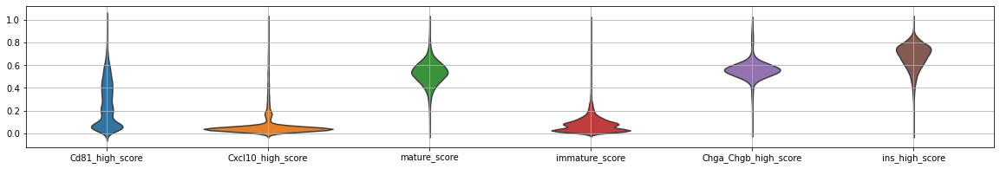

In [12]:
# Plot of normalised scores distribution in whole dataset, per cluster
rcParams['figure.figsize']=(20,3)
fig,ax=plt.subplots()
sb.violinplot(data=scores_df_norm_beta,inner=None,ax=ax)
ax.grid()

In [13]:
# Convert ins high to ins low
scores_df_norm_beta['ins_low_score']=scores_df_norm_beta['ins_high_score']*-1+1

In [14]:
# Dict for score thresholds
beta_marker_thresholds=dict()

Text(0, 0.5, 'mature_score')

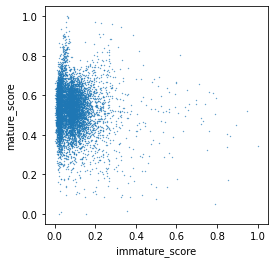

In [15]:
# Find immature
rcParams['figure.figsize']=(4,4)
plt.scatter(scores_df_norm_beta['immature_score'],scores_df_norm_beta['mature_score'],s=0.1)
plt.xlabel('immature_score')
plt.ylabel('mature_score')

#C: There does not seem to be immature & mature low subpopulation. The cells that have low mature and immature markers may have low counts in general and this is probably then accounted for in scoring.

Dist of differences between mature and immature

In [16]:
scores_df_norm_beta['immature-mature_score']=scores_df_norm_beta['immature_score']-scores_df_norm_beta['mature_score']

Text(0.5, 0, 'immature-mature score')

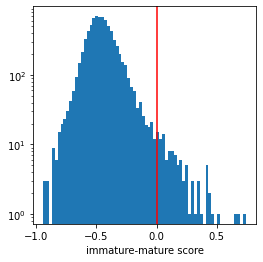

In [17]:
a=plt.hist(scores_df_norm_beta['immature-mature_score'],bins=70)
plt.yscale('log')
beta_marker_thresholds['immature-mature_score']=0
plt.axvline(beta_marker_thresholds['immature-mature_score'],c='r')
plt.xlabel('immature-mature score')

Text(0, 0.5, 'mature_score')

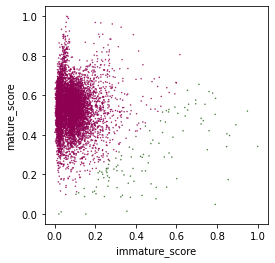

In [18]:
plt.scatter(scores_df_norm_beta['immature_score'],scores_df_norm_beta['mature_score'],s=0.2,
            c=scores_df_norm_beta['immature-mature_score']>=beta_marker_thresholds['immature-mature_score'],
            cmap='PiYG')
plt.xlabel('immature_score')
plt.ylabel('mature_score')

Text(0, 0.5, 'immature-mature_score')

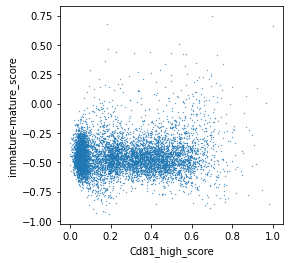

In [19]:
plt.scatter(scores_df_norm_beta['Cd81_high_score'],scores_df_norm_beta['immature-mature_score'],s=0.1)
plt.xlabel('Cd81_high_score')
plt.ylabel('immature-mature_score')

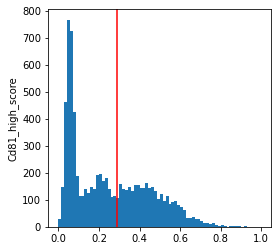

In [20]:
a=plt.hist(scores_df_norm_beta['Cd81_high_score'],bins=70)
#plt.yscale('log')
plt.ylabel('Cd81_high_score')
beta_marker_thresholds['Cd81_high_score']=0.29
plt.axvline(beta_marker_thresholds['Cd81_high_score'],c='r')

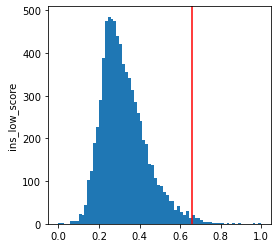

In [21]:
a=plt.hist(scores_df_norm_beta['ins_low_score'],bins=70)
#plt.yscale('log')
plt.ylabel('ins_low_score')
beta_marker_thresholds['ins_low_score']=0.66
plt.axvline(beta_marker_thresholds['ins_low_score'],c='r')

Text(0, 0.5, 'immature-mature_score')

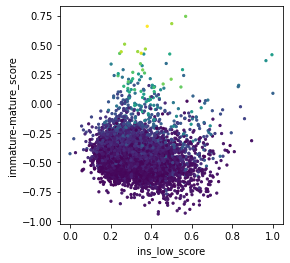

In [43]:
plt.scatter(scores_df_norm_beta['ins_low_score'],scores_df_norm_beta['immature-mature_score'],s=5,
           c=scores_df_norm_beta['immature_score'])
plt.xlabel('ins_low_score')
plt.ylabel('immature-mature_score')

#C: ins_low cells with high immature-mature score might not be immature - they have relatively low immature score (color; without mature score subtraction).

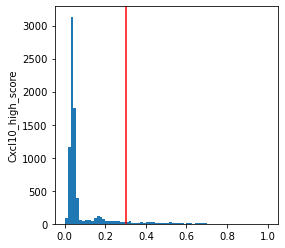

In [58]:
a=plt.hist(scores_df_norm_beta['Cxcl10_high_score'],bins=70)
#plt.yscale('log')
plt.ylabel('Cxcl10_high_score')
beta_marker_thresholds['Cxcl10_high_score']=0.3
plt.axvline(beta_marker_thresholds['Cxcl10_high_score'],c='r')

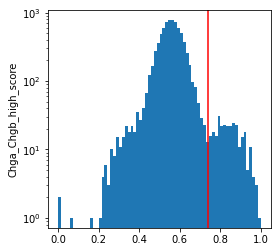

In [23]:
a=plt.hist(scores_df_norm_beta['Chga_Chgb_high_score'],bins=70)
plt.yscale('log')
plt.ylabel('Chga_Chgb_high_score')
beta_marker_thresholds['Chga_Chgb_high_score']=0.74
plt.axvline(beta_marker_thresholds['Chga_Chgb_high_score'],c='r')

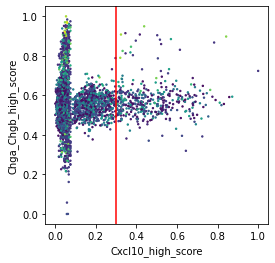

In [67]:
plt.scatter(scores_df_norm_beta['Cxcl10_high_score'],scores_df_norm_beta['Chga_Chgb_high_score'],s=2,
           c=scores_df_norm_beta['Cd81_high_score'])
plt.xlabel('Cxcl10_high_score')
plt.ylabel('Chga_Chgb_high_score')
plt.axvline(beta_marker_thresholds['Cxcl10_high_score'],c='r')

#C: there seems to be Cxcl10 Chga Chgb high population.

Text(0, 0.5, 'Chga_Chgb_high_score')

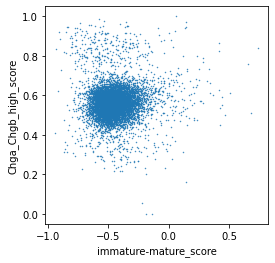

In [73]:
plt.scatter(scores_df_norm_beta['immature-mature_score'],scores_df_norm_beta['Chga_Chgb_high_score'],s=0.2)
plt.xlabel('immature-mature_score')
plt.ylabel('Chga_Chgb_high_score')

#C: Immature Chga Chgb does not seem to be true population.

In [60]:
# Thresholds for cell type assignemnt based on normalised scores
scores_cols_beta=['immature-mature_score','Cd81_high_score','ins_low_score','Cxcl10_high_score',
                 'Chga_Chgb_high_score']
thresholds_beta=[beta_marker_thresholds[score_col] for score_col in scores_cols_beta]

In [61]:
# Assign cell types based on scores to each cell
assignment_df_beta=scores_df_norm_beta[scores_cols_beta]>=thresholds_beta
# replace '-mature' from immature-mature to get just immature out for the cell type name
assignment_df_beta.columns=[col.replace('_score','').replace('-mature','') for col in scores_cols_beta] 

In [62]:
# For each cell make a (standard) string of annotated cell types: 
# e.g. each annotated cell type in the same order, separated by '_' when multiple cell types were annotated
type_unions_beta=[]
for idx,row in assignment_df_beta.iterrows():
    type_union=''
    for col in row.index:
        # Remove Ccl5 from union of cell types
        if row[col]:
            type_union=type_union+col+'_'
    if type_union=='':
        type_union='NA'
    type_unions_beta.append(type_union.rstrip('_'))

In [63]:
# Add cell types strings of cells to scores/assignment DF
assignment_df_beta['type_union']=type_unions_beta
assignment_df_beta['type_union'].value_counts()

NA                                              4179
Cd81_high                                       2809
Cxcl10_high                                      237
Cd81_high_Cxcl10_high                            149
Chga_Chgb_high                                   142
Cd81_high_Chga_Chgb_high                         106
immature_Cd81_high                                64
ins_low                                           52
immature                                          18
Cd81_high_ins_low                                 15
immature_Cd81_high_Chga_Chgb_high                 14
Cxcl10_high_Chga_Chgb_high                        11
Cd81_high_Cxcl10_high_Chga_Chgb_high               7
immature_ins_low                                   5
ins_low_Chga_Chgb_high                             3
immature_Cd81_high_Cxcl10_high                     3
immature_Chga_Chgb_high                            2
immature_ins_low_Cxcl10_high                       1
immature_Cxcl10_high                          

In [82]:
adata_rawnormalised_beta.obs['beta_subtype']=assignment_df_beta['type_union']

... storing 'beta_subtype' as categorical


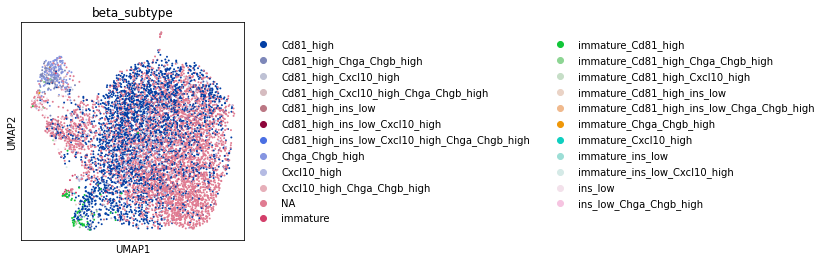

In [65]:
rcParams['figure.figsize']=(4,4)
sc.pl.umap(adata_rawnormalised_beta,color='beta_subtype')

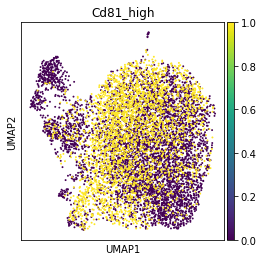

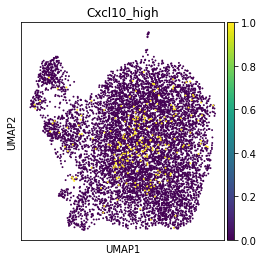

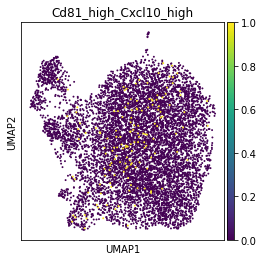

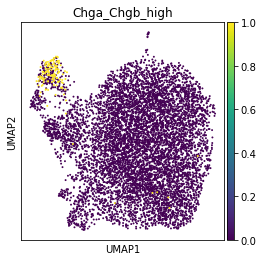

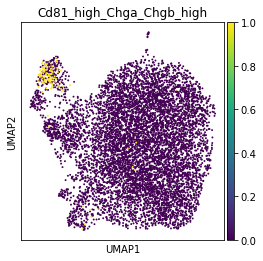

...

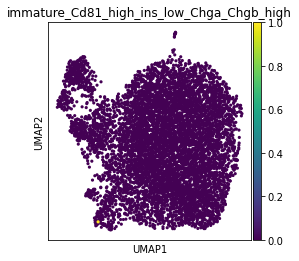

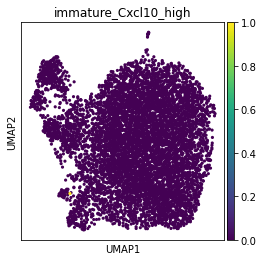

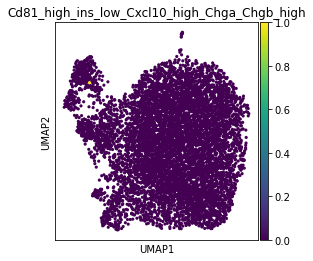

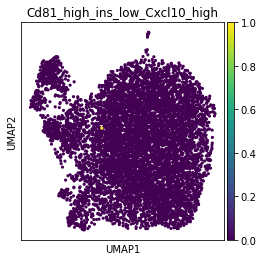

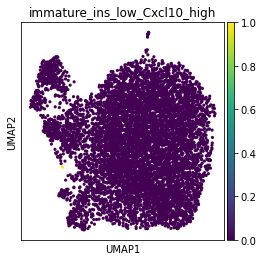

In [66]:
for subtype,count in adata_rawnormalised_beta.obs.beta_subtype.value_counts().iteritems():
    if subtype !='NA':
        s=40 if count < 100 else 15
        adata_rawnormalised_beta.obs['temp']=adata_rawnormalised_beta.obs['beta_subtype']==subtype
        sc.pl.umap(adata_rawnormalised_beta,color='temp',size=s,title=subtype)
adata_rawnormalised_beta.obs.drop('temp',axis=1,inplace=True)

In [85]:
# rename cell types
adata_rawnormalised_beta.obs['beta_subtype'].replace({
    'immature_Cd81_high':'immature',
    'immature_Cd81_high_Chga_Chgb_high':'Cd81_high_Chga_Chgb_high',
    #'Cd81_high_Cxcl10_high_Chga_Chgb_high':'Cd81_high_Chga_Chgb_high',
    'ins_low_Chga_Chgb_high':'Chga_Chgb_high',
    'immature_Cd81_high_ins_low':'immature',
    'immature_Cd81_high_ins_low_Chga_Chgb_high':'immature',
    'immature_Cxcl10_high':'immature',
    'immature_Cd81_high_Cxcl10_high':'immature',
    'Cd81_high_ins_low_Cxcl10_high_Chga_Chgb_high':'Cd81_high_Cxcl10_high_Chga_Chgb_high',
    'immature_ins_low_Cxcl10_high':'immature',
    'Cd81_high_ins_low_Cxcl10_high':'Cd81_high_Cxcl10_high',
    'immature_ins_low':'ins_low',
    'immature_Chga_Chgb_high':'Chga_Chgb_high'
    
}, inplace=True)

In [86]:
adata_rawnormalised_beta.obs.beta_subtype.value_counts()

NA                                      4179
Cd81_high                               2809
Cxcl10_high                              237
Cd81_high_Cxcl10_high                    150
Chga_Chgb_high                           147
Cd81_high_Chga_Chgb_high                 120
immature                                  89
ins_low                                   57
Cd81_high_ins_low                         15
Cxcl10_high_Chga_Chgb_high                11
Cd81_high_Cxcl10_high_Chga_Chgb_high       8
Name: beta_subtype, dtype: int64

... storing 'beta_subtype' as categorical


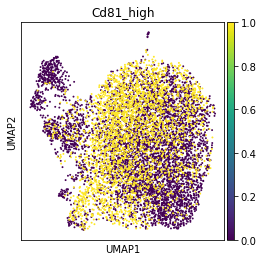

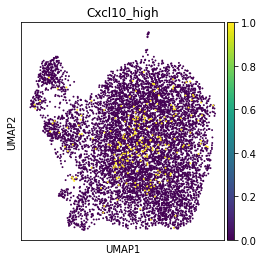

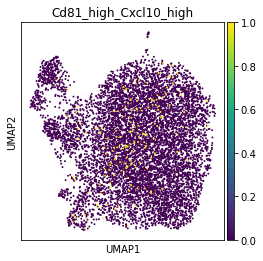

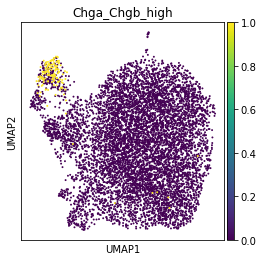

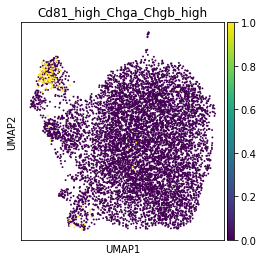

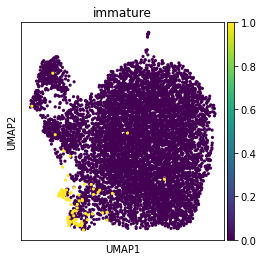

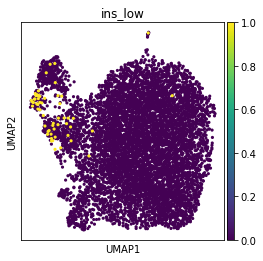

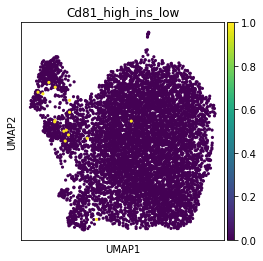

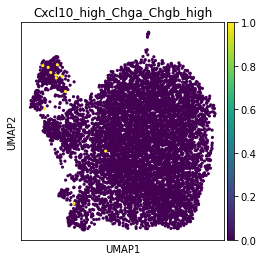

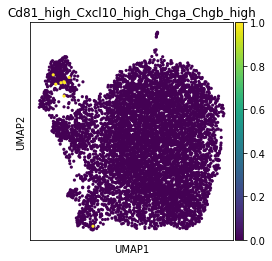

In [87]:
for subtype,count in adata_rawnormalised_beta.obs.beta_subtype.value_counts().iteritems():
    if subtype !='NA':
        s=40 if count < 100 else 15
        adata_rawnormalised_beta.obs['temp']=adata_rawnormalised_beta.obs['beta_subtype']==subtype
        sc.pl.umap(adata_rawnormalised_beta,color='temp',size=s,title=subtype)
adata_rawnormalised_beta.obs.drop('temp',axis=1,inplace=True)

In [88]:
# Add cell type data to adata
adata.obs[['cell_subtype','cell_subtype_multiplet']]=adata.obs[['cell_type','cell_type_multiplet']]
for subtype in adata_rawnormalised_beta.obs['beta_subtype'].unique():
    if subtype != 'NA':
        idxs=adata_rawnormalised_beta.obs.query('beta_subtype == @subtype').index
        subtype='beta_'+subtype
        add_category(df=adata.obs,idxs=idxs,col='cell_subtype',category=subtype)
        add_category(df=adata.obs,idxs=idxs,col='cell_subtype_multiplet',category=subtype)
# reorder categories
adata.obs.cell_subtype=pd.Categorical(adata.obs.cell_subtype,
                                   categories=sorted(list(adata.obs.cell_subtype.unique())),ordered=True)
adata.obs.cell_subtype_multiplet=pd.Categorical(adata.obs.cell_subtype_multiplet,
                                  categories=sorted(list(adata.obs.cell_subtype_multiplet.unique())),ordered=True)

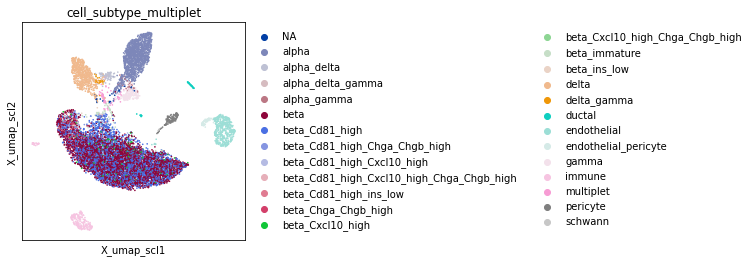

In [89]:
sc.pl.embedding(adata,'X_umap_scl',color='cell_subtype_multiplet')

### Save annotation

In [90]:
if SAVE:
    h.save_h5ad(adata, shared_folder+"data_annotated.h5ad",unique_id2=UID2)

In [7]:
#adata=h.open_h5ad(shared_folder+"data_annotated.h5ad",unique_id2=UID2)